In [1]:
import shutil
import os
import random
from time import time
import matplotlib.pyplot as plt
import numpy as np
import torch
from torch.nn.utils import spectral_norm
from torch.utils.data import Dataset
import torchvision
import xml.etree.ElementTree as ET
from tqdm import tqdm_notebook as tqdm
from scipy.stats import truncnorm


In [2]:
CHANNEL = {'RGB': 3, 'BW': 1}
IMG_CHANNEL = CHANNEL['RGB']
DATA_LOCATION = '../input/all-dogs/all-dogs/'
BATCH_SIZE = 32
LATENT_DIM = 100
CONV_DEPTHS_G = 32
CONV_DEPTHS_D = 48
LEARNING_RATE_G = 0.0003  
LEARNING_RATE_D = 0.0001 
BETA_1 = 0.5
T0_interval = 200
EPOCHS = 400 
NUM_CLASSES = 10
TIME_FOR_TRAIN = 25000 

In [3]:
def seed_everything(seed=42):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    
seed_everything()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
class DataGenerator(Dataset):
    def __init__(self, directory, transform=None, n_samples=np.inf):
        self.directory = directory
        self.transform = transform
        self.n_samples = n_samples
        self.samples = self._load_subfolders_images(directory)
        if len(self.samples) == 0:
            raise RuntimeError("Found 0 files in subfolders of: {}".format(directory))

    def _load_subfolders_images(self, root):
        IMG_EXTENSIONS = (
            '.jpg', '.jpeg', '.png', '.ppm', '.bmp', '.pgm', '.tif', '.tiff', '.webp')

        def is_valid_file(x):
            return torchvision.datasets.folder.has_file_allowed_extension(x, IMG_EXTENSIONS)            
        required_transforms = torchvision.transforms.Compose([
            torchvision.transforms.Resize(64),
            torchvision.transforms.CenterCrop(64),
        ])
        imgs = []
        paths = []
        for root, _, fnames in sorted(os.walk(root)):
            for fname in sorted(fnames)[:min(self.n_samples, 999999999999999)]:
                path = os.path.join(root, fname)
                paths.append(path)

        for path in paths:
            if is_valid_file(path):
                img = torchvision.datasets.folder.default_loader(path)

                annotation_basename = os.path.splitext(os.path.basename(path))[0]
                annotation_dirname = next(
                    dirname for dirname in os.listdir('../input/annotation/Annotation/') if
                    dirname.startswith(annotation_basename.split('_')[0]))
                annotation_filename = os.path.join('../input/annotation/Annotation/',
                                                   annotation_dirname, annotation_basename)
                tree = ET.parse(annotation_filename)
                root = tree.getroot()
                objects = root.findall('object')
                for o in objects:
                    bndbox = o.find('bndbox')
                    xmin = int(bndbox.find('xmin').text)
                    ymin = int(bndbox.find('ymin').text)
                    xmax = int(bndbox.find('xmax').text)
                    ymax = int(bndbox.find('ymax').text)

                    w = np.min((xmax - xmin, ymax - ymin))
                    bbox = (xmin, ymin, xmin + w, ymin + w)
                    object_img = required_transforms(img.crop(bbox))
                    imgs.append(object_img)
        return imgs

    def __getitem__(self, index):
        sample = self.samples[index]

        if self.transform is not None:
            sample = self.transform(sample)

        return np.asarray(sample)

    def __len__(self):
        return len(self.samples)
    

transform = torchvision.transforms.Compose([torchvision.transforms.RandomHorizontalFlip(p=0.1),
                                            torchvision.transforms.ToTensor(),
                                            torchvision.transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])    
data_gen = DataGenerator(DATA_LOCATION, transform=transform, n_samples=25000)
train_loader = torch.utils.data.DataLoader(data_gen, shuffle=True, batch_size=BATCH_SIZE, num_workers=4)

In [5]:
class PixelwiseNorm(torch.nn.Module):
    def __init__(self):
        super(PixelwiseNorm, self).__init__()

    def forward(self, x, alpha=1e-8):
        y = x.pow(2.).mean(dim=1, keepdim=True).add(alpha).sqrt()  
        y = x / y 
        return y
    
class Generator(torch.nn.Module):
    def __init__(self, latent_dim, nfeats, nchannels): 
        super(Generator, self).__init__()
        self.conv1 = spectral_norm(torch.nn.ConvTranspose2d(latent_dim, nfeats * 8, 4, 1, 0, bias=False))
        self.conv2 = spectral_norm(torch.nn.ConvTranspose2d(nfeats * 8, nfeats * 8, 4, 2, 1, bias=False))
        self.conv3 = spectral_norm(torch.nn.ConvTranspose2d(nfeats * 8, nfeats * 4, 4, 2, 1, bias=False))
        self.conv4 = spectral_norm(torch.nn.ConvTranspose2d(nfeats * 4, nfeats * 2, 4, 2, 1, bias=False))
        self.conv5 = spectral_norm(torch.nn.ConvTranspose2d(nfeats * 2, nfeats, 4, 2, 1, bias=False))
        self.conv6 = spectral_norm(torch.nn.ConvTranspose2d(nfeats, nchannels, 3, 1, 1, bias=False))
        self.pixnorm = PixelwiseNorm()

    def forward(self, x):
        x = torch.nn.functional.leaky_relu(self.conv1(x))
        x = self.pixnorm(x) 
        x = torch.nn.functional.leaky_relu(self.conv2(x))
        x = torch.nn.Dropout(0.05)(x)
        x = self.pixnorm(x)
        x = torch.nn.functional.leaky_relu(self.conv3(x))
        x = self.pixnorm(x)        
        x = torch.nn.functional.leaky_relu(self.conv4(x))
        x = torch.nn.Dropout(0.05)(x)
        x = self.pixnorm(x)
        x = torch.nn.functional.leaky_relu(self.conv5(x))
        x = self.pixnorm(x)
        x = torch.tanh(self.conv6(x))
        return x

In [6]:
class MinibatchStdDev(torch.nn.Module):
    def __init__(self):
        super(MinibatchStdDev, self).__init__()

    def forward(self, x, alpha=1e-8):
        batch_size, _, height, width = x.shape
        y = x - x.mean(dim=0, keepdim=True)
        y = torch.sqrt(y.pow(2.).mean(dim=0, keepdim=False) + alpha)
        y = y.mean().view(1, 1, 1, 1)
        y = y.repeat(batch_size, 1, height, width)
        y = torch.cat([x, y], 1)
        return y

In [7]:
class Discriminator(torch.nn.Module):
    def __init__(self, nchannels, nfeats):
        super(Discriminator, self).__init__()
        self.conv1 = torch.nn.Conv2d(nchannels, nfeats, 4, 2, 1, bias=False)
        self.conv2 = spectral_norm(torch.nn.Conv2d(nfeats, nfeats * 2, 4, 2, 1, bias=False))
        self.bn2 = torch.nn.BatchNorm2d(nfeats * 2)
        self.conv3 = spectral_norm(torch.nn.Conv2d(nfeats * 2, nfeats * 4, 4, 2, 1, bias=False))
        self.bn3 = torch.nn.BatchNorm2d(nfeats * 4)
        self.conv4 = spectral_norm(torch.nn.Conv2d(nfeats * 4, nfeats * 8, 4, 2, 1, bias=False))
        self.bn4 = torch.nn.MaxPool2d(2)
        self.batch_discriminator = MinibatchStdDev()
        self.conv5 = spectral_norm(torch.nn.Conv2d(nfeats * 8 + 1, 1, 2, 1, 0, bias=False))
    def forward(self, x):
        x = torch.nn.functional.leaky_relu(self.conv1(x), 0.2)
        x = torch.nn.functional.leaky_relu(self.bn2(self.conv2(x)), 0.2)
        x = torch.nn.functional.leaky_relu(self.bn3(self.conv3(x)), 0.2)
        x = torch.nn.functional.leaky_relu(self.bn4(self.conv4(x)), 0.2)
        x = self.batch_discriminator(x)
        x = self.conv5(x)
        x  = x.view(x.size(0), -1)
        return x


In [8]:
def show_generated_img_all():
    gen_z = torch.randn(32, LATENT_DIM, 1, 1, device=device)
    gen_images = netG(gen_z).to("cpu").clone().detach()
    gen_images = gen_images.numpy().transpose(0, 2, 3, 1)
    gen_images = (gen_images + 1.0) / 2.0
    fig = plt.figure(figsize=(25, 16))
    for ii, img in enumerate(gen_images):
        ax = fig.add_subplot(4, 8, ii + 1, xticks=[], yticks=[])
        plt.imshow(img)

def show_generated_img():
    row_num = 1
    col_num = 10 
    gen_z = torch.randn(row_num * col_num , LATENT_DIM, 1, 1, device=device)
    gen_images = netG(gen_z).to("cpu").clone().detach()
    gen_images = gen_images.numpy().transpose(0, 2, 3, 1)
    gen_images = (gen_images + 1.0) / 2.0
    fig = plt.figure(figsize=(20, 4))
    for ii, img in enumerate(gen_images):
        ax = fig.add_subplot(row_num, col_num, ii + 1, xticks=[], yticks=[])
        plt.imshow(img)
    plt.show()

In [9]:
def mse_loss(input, target):
    return torch.sum((input - target)**2) / input.data.nelement()
gan_loss = mse_loss
fixed_noise = torch.randn(25, LATENT_DIM, 1, 1, device=device)


In [10]:
def truncated_normal(size, threshold=1):
    values = truncnorm.rvs(-threshold, threshold, size=size)
    return values

In [11]:
def train_module(epochs):
    step = 0
    start = time()
    for epoch in range(epochs):
        for ii, (real_images) in enumerate(train_loader):
            end = time()
            if (end - start) > TIME_FOR_TRAIN:
                break
            netD.zero_grad()
            real_images = real_images.to(device)
            batch_size = real_images.size(0)
            labels = torch.full((batch_size, 1), real_label, device=device)

            outputR = netD(real_images)
            D_x = outputR.mean().item()

            noise = torch.randn(batch_size, LATENT_DIM,1, 1, device=device)
            fake = netG(noise)
            outputF = netD(fake.detach())
            D_G_z1 = outputF.mean().item()
            errD = gan_loss(outputR, torch.mean(outputF) + labels) + gan_loss(outputF, torch.mean(outputR) - labels)
            errD.backward(retain_graph=True)
            optimizerD.step()
            netG.zero_grad()
            labels.fill_(real_label) 
            outputF = netD(fake)
            errG = gan_loss(outputR, torch.mean(outputF) - labels) + gan_loss(outputF, torch.mean(outputR) + labels)
            errG.backward(retain_graph=True)
            D_G_z2 = outputF.mean().item()
            optimizerG.step()

            if step % 500 == 0:
                print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f / %.4f'
                      % (epoch + 1, epochs, ii, len(train_loader),
                         errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
                valid_image = netG(fixed_noise)
            
            step += 1
            lr_schedulerG.step(epoch)
            lr_schedulerD.step(epoch)
            
        if epoch % 5 == 0:
            show_generated_img()
            print(end - start)
        if (end - start) > TIME_FOR_TRAIN:
            break

[1/400][0/692] Loss_D: 0.6871 Loss_G: 92.5992 D(x): -0.0582 D(G(z)): -0.0129 / -6.3533
[1/400][500/692] Loss_D: 0.0274 Loss_G: 2.1886 D(x): -0.2258 D(G(z)): -0.7246 / -0.7651


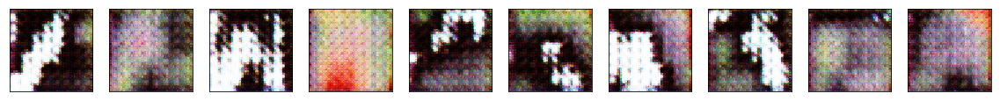

35.71648097038269
[2/400][308/692] Loss_D: 0.2090 Loss_G: 1.9279 D(x): -0.8173 D(G(z)): -1.0922 / -1.2731
[3/400][116/692] Loss_D: 0.1848 Loss_G: 2.3210 D(x): -0.3153 D(G(z)): -0.5847 / -0.8752
[3/400][616/692] Loss_D: 0.3047 Loss_G: 2.4115 D(x): -0.0599 D(G(z)): -0.2533 / -0.6364
[4/400][424/692] Loss_D: 0.1410 Loss_G: 1.9643 D(x): -0.2486 D(G(z)): -0.6081 / -0.7189
[5/400][232/692] Loss_D: 0.1537 Loss_G: 2.1557 D(x): 0.0656 D(G(z)): -0.3224 / -0.4428
[6/400][40/692] Loss_D: 0.1048 Loss_G: 1.9599 D(x): -0.0069 D(G(z)): -0.4408 / -0.4746
[6/400][540/692] Loss_D: 0.1127 Loss_G: 1.6878 D(x): -0.4505 D(G(z)): -0.7758 / -0.8550


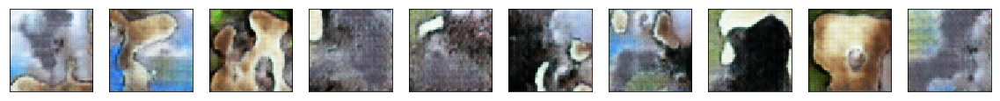

214.58635830879211
[7/400][348/692] Loss_D: 0.1855 Loss_G: 2.1275 D(x): 0.0037 D(G(z)): -0.2801 / -0.5041
[8/400][156/692] Loss_D: 0.1301 Loss_G: 1.6649 D(x): -0.2512 D(G(z)): -0.6140 / -0.6433
[8/400][656/692] Loss_D: 0.1700 Loss_G: 1.8860 D(x): -0.4731 D(G(z)): -0.7612 / -0.9263
[9/400][464/692] Loss_D: 0.1612 Loss_G: 2.1357 D(x): 0.1135 D(G(z)): -0.2218 / -0.4017
[10/400][272/692] Loss_D: 0.0961 Loss_G: 1.8340 D(x): -0.1947 D(G(z)): -0.5851 / -0.6351
[11/400][80/692] Loss_D: 0.1426 Loss_G: 2.8022 D(x): -0.0610 D(G(z)): -0.3904 / -0.7303
[11/400][580/692] Loss_D: 0.0780 Loss_G: 2.2432 D(x): 0.0224 D(G(z)): -0.4156 / -0.5251


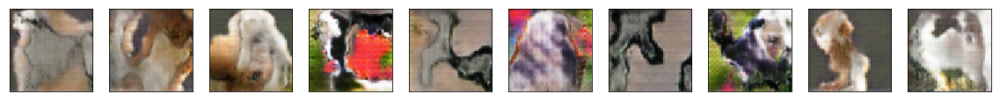

393.20904183387756
[12/400][388/692] Loss_D: 0.0809 Loss_G: 1.9774 D(x): -0.0843 D(G(z)): -0.4985 / -0.5651
[13/400][196/692] Loss_D: 0.0908 Loss_G: 2.3761 D(x): 0.0063 D(G(z)): -0.4666 / -0.5695
[14/400][4/692] Loss_D: 0.0812 Loss_G: 1.8783 D(x): -0.0639 D(G(z)): -0.4484 / -0.5210
[14/400][504/692] Loss_D: 0.0866 Loss_G: 1.9091 D(x): 0.0369 D(G(z)): -0.3860 / -0.4256
[15/400][312/692] Loss_D: 0.1454 Loss_G: 2.1215 D(x): 0.0121 D(G(z)): -0.3418 / -0.5013
[16/400][120/692] Loss_D: 0.0762 Loss_G: 1.9860 D(x): 0.0017 D(G(z)): -0.4313 / -0.4805
[16/400][620/692] Loss_D: 0.0570 Loss_G: 2.0535 D(x): -0.0782 D(G(z)): -0.5301 / -0.5809


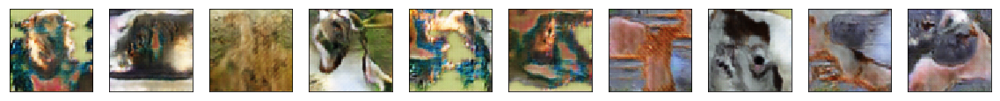

570.69447016716
[17/400][428/692] Loss_D: 0.0921 Loss_G: 2.1002 D(x): 0.3778 D(G(z)): -0.0567 / -0.1314
[18/400][236/692] Loss_D: 0.0589 Loss_G: 1.9734 D(x): 0.0338 D(G(z)): -0.4591 / -0.4480
[19/400][44/692] Loss_D: 0.1164 Loss_G: 1.9090 D(x): -0.0245 D(G(z)): -0.3383 / -0.4907
[19/400][544/692] Loss_D: 0.0893 Loss_G: 2.2362 D(x): 0.1012 D(G(z)): -0.2774 / -0.4473
[20/400][352/692] Loss_D: 0.0709 Loss_G: 2.0803 D(x): -0.1373 D(G(z)): -0.6149 / -0.6424
[21/400][160/692] Loss_D: 0.0845 Loss_G: 2.0659 D(x): 0.0885 D(G(z)): -0.3371 / -0.4153
[21/400][660/692] Loss_D: 0.1910 Loss_G: 1.7376 D(x): -0.1760 D(G(z)): -0.4109 / -0.5943


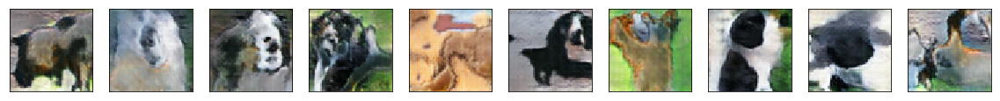

748.5838294029236
[22/400][468/692] Loss_D: 0.0618 Loss_G: 1.9522 D(x): 0.2039 D(G(z)): -0.2188 / -0.2739
[23/400][276/692] Loss_D: 0.0629 Loss_G: 2.1934 D(x): 0.1369 D(G(z)): -0.2718 / -0.4025
[24/400][84/692] Loss_D: 0.0522 Loss_G: 1.9751 D(x): 0.0808 D(G(z)): -0.3554 / -0.4034
[24/400][584/692] Loss_D: 0.0569 Loss_G: 2.0453 D(x): -0.0354 D(G(z)): -0.4735 / -0.5366
[25/400][392/692] Loss_D: 0.1234 Loss_G: 2.0879 D(x): 0.0508 D(G(z)): -0.3168 / -0.4534
[26/400][200/692] Loss_D: 0.0743 Loss_G: 1.9280 D(x): 0.1037 D(G(z)): -0.2816 / -0.3694


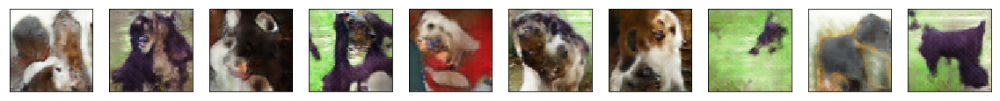

925.6128966808319
[27/400][8/692] Loss_D: 0.0674 Loss_G: 1.9078 D(x): -0.0168 D(G(z)): -0.4638 / -0.4831
[27/400][508/692] Loss_D: 0.0757 Loss_G: 2.4244 D(x): 0.1141 D(G(z)): -0.3134 / -0.4761
[28/400][316/692] Loss_D: 0.0592 Loss_G: 1.9357 D(x): -0.0171 D(G(z)): -0.4337 / -0.4934
[29/400][124/692] Loss_D: 0.1251 Loss_G: 1.8695 D(x): 0.0877 D(G(z)): -0.2136 / -0.3690
[29/400][624/692] Loss_D: 0.0696 Loss_G: 2.5151 D(x): 0.1549 D(G(z)): -0.2463 / -0.4592
[30/400][432/692] Loss_D: 0.0510 Loss_G: 1.8915 D(x): -0.0451 D(G(z)): -0.4682 / -0.5101
[31/400][240/692] Loss_D: 0.0506 Loss_G: 2.2482 D(x): 0.0834 D(G(z)): -0.3290 / -0.4716


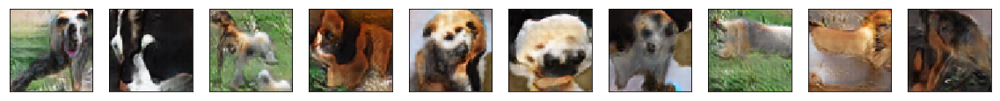

1102.8296301364899
[32/400][48/692] Loss_D: 0.0427 Loss_G: 2.0259 D(x): 0.1212 D(G(z)): -0.3818 / -0.3777
[32/400][548/692] Loss_D: 0.0390 Loss_G: 1.9465 D(x): 0.1164 D(G(z)): -0.3215 / -0.3642
[33/400][356/692] Loss_D: 0.0657 Loss_G: 2.1382 D(x): 0.3095 D(G(z)): -0.1309 / -0.2176
[34/400][164/692] Loss_D: 0.0421 Loss_G: 2.2239 D(x): 0.1516 D(G(z)): -0.3978 / -0.3954
[34/400][664/692] Loss_D: 0.0795 Loss_G: 1.8105 D(x): 0.0608 D(G(z)): -0.3020 / -0.3827
[35/400][472/692] Loss_D: 0.0834 Loss_G: 2.2643 D(x): 0.2362 D(G(z)): -0.1364 / -0.3194
[36/400][280/692] Loss_D: 0.0373 Loss_G: 1.9096 D(x): 0.2723 D(G(z)): -0.1638 / -0.1991


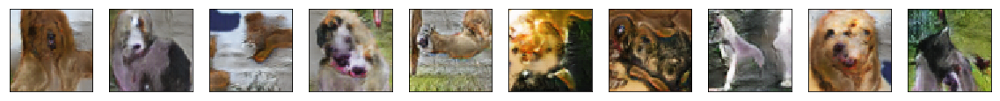

1279.7514863014221
[37/400][88/692] Loss_D: 0.0427 Loss_G: 2.2630 D(x): 0.4100 D(G(z)): -0.0731 / -0.1460
[37/400][588/692] Loss_D: 0.0490 Loss_G: 2.0879 D(x): 0.3469 D(G(z)): -0.1072 / -0.1677
[38/400][396/692] Loss_D: 0.0495 Loss_G: 1.9054 D(x): 0.1480 D(G(z)): -0.2693 / -0.3207
[39/400][204/692] Loss_D: 0.0855 Loss_G: 2.2685 D(x): 0.1262 D(G(z)): -0.2176 / -0.4324
[40/400][12/692] Loss_D: 0.0472 Loss_G: 1.9686 D(x): 0.3527 D(G(z)): -0.0998 / -0.1311
[40/400][512/692] Loss_D: 0.0255 Loss_G: 2.0273 D(x): 0.2653 D(G(z)): -0.2194 / -0.2368
[41/400][320/692] Loss_D: 0.0455 Loss_G: 2.0932 D(x): 0.2218 D(G(z)): -0.2391 / -0.2939


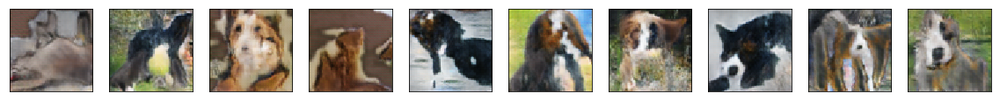

1456.2747066020966
[42/400][128/692] Loss_D: 0.0412 Loss_G: 1.9678 D(x): 0.2117 D(G(z)): -0.2194 / -0.2743
[42/400][628/692] Loss_D: 0.0294 Loss_G: 1.9101 D(x): 0.1692 D(G(z)): -0.2912 / -0.3031
[43/400][436/692] Loss_D: 0.0507 Loss_G: 2.4003 D(x): 0.4147 D(G(z)): -0.0440 / -0.1749
[44/400][244/692] Loss_D: 0.0802 Loss_G: 1.9003 D(x): 0.1422 D(G(z)): -0.2180 / -0.3247
[45/400][52/692] Loss_D: 0.0499 Loss_G: 2.1211 D(x): 0.3665 D(G(z)): -0.1313 / -0.1573
[45/400][552/692] Loss_D: 0.0605 Loss_G: 2.2588 D(x): 0.3753 D(G(z)): 0.0015 / -0.1827
[46/400][360/692] Loss_D: 0.0293 Loss_G: 2.0107 D(x): 0.2923 D(G(z)): -0.1877 / -0.2051


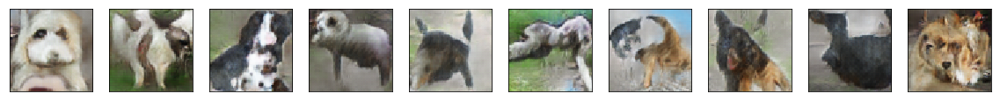

1633.2025656700134
[47/400][168/692] Loss_D: 0.0405 Loss_G: 2.1920 D(x): 0.3463 D(G(z)): -0.1206 / -0.1958
[47/400][668/692] Loss_D: 0.0742 Loss_G: 2.2986 D(x): 0.0921 D(G(z)): -0.2631 / -0.4755
[48/400][476/692] Loss_D: 0.0404 Loss_G: 1.9563 D(x): 0.1486 D(G(z)): -0.2876 / -0.3350
[49/400][284/692] Loss_D: 0.0504 Loss_G: 2.0900 D(x): 0.2467 D(G(z)): -0.2128 / -0.2690
[50/400][92/692] Loss_D: 0.0379 Loss_G: 1.8924 D(x): 0.2466 D(G(z)): -0.1805 / -0.2215
[50/400][592/692] Loss_D: 0.0382 Loss_G: 2.0483 D(x): 0.2627 D(G(z)): -0.2086 / -0.2434
[51/400][400/692] Loss_D: 0.0611 Loss_G: 2.1864 D(x): 0.2839 D(G(z)): -0.1064 / -0.2557


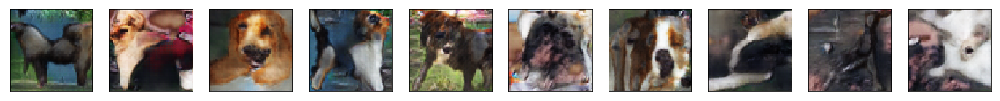

1809.9485311508179
[52/400][208/692] Loss_D: 0.0448 Loss_G: 1.9314 D(x): 0.2898 D(G(z)): -0.1602 / -0.1851
[53/400][16/692] Loss_D: 0.0491 Loss_G: 2.0968 D(x): 0.2525 D(G(z)): -0.1681 / -0.2644
[53/400][516/692] Loss_D: 0.0688 Loss_G: 2.0775 D(x): 0.2360 D(G(z)): -0.1225 / -0.2785
[54/400][324/692] Loss_D: 0.0365 Loss_G: 1.9283 D(x): 0.2234 D(G(z)): -0.2325 / -0.2529
[55/400][132/692] Loss_D: 0.0754 Loss_G: 2.1661 D(x): 0.1987 D(G(z)): -0.1797 / -0.3369
[55/400][632/692] Loss_D: 0.0768 Loss_G: 2.1582 D(x): 0.3856 D(G(z)): -0.0227 / -0.1459
[56/400][440/692] Loss_D: 0.0298 Loss_G: 1.9304 D(x): 0.1699 D(G(z)): -0.2796 / -0.3078


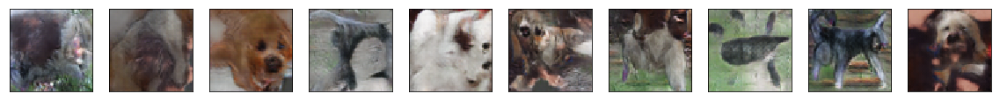

1986.8874597549438
[57/400][248/692] Loss_D: 0.0392 Loss_G: 2.0609 D(x): 0.2377 D(G(z)): -0.2163 / -0.2728
[58/400][56/692] Loss_D: 0.0281 Loss_G: 1.9818 D(x): 0.2890 D(G(z)): -0.1780 / -0.2020
[58/400][556/692] Loss_D: 0.0311 Loss_G: 1.9602 D(x): 0.2323 D(G(z)): -0.2320 / -0.2528
[59/400][364/692] Loss_D: 0.0690 Loss_G: 2.3938 D(x): 0.3823 D(G(z)): 0.0031 / -0.2064
[60/400][172/692] Loss_D: 0.0317 Loss_G: 1.9082 D(x): 0.1728 D(G(z)): -0.2840 / -0.2987
[60/400][672/692] Loss_D: 0.0383 Loss_G: 2.0810 D(x): 0.3177 D(G(z)): -0.2066 / -0.1955
[61/400][480/692] Loss_D: 0.0357 Loss_G: 2.0251 D(x): 0.2771 D(G(z)): -0.2001 / -0.2243


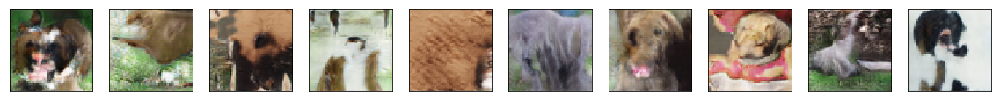

2162.0064826011658
[62/400][288/692] Loss_D: 0.0330 Loss_G: 2.1177 D(x): 0.2928 D(G(z)): -0.2429 / -0.2305
[63/400][96/692] Loss_D: 0.0270 Loss_G: 2.0510 D(x): 0.3016 D(G(z)): -0.2205 / -0.2072
[63/400][596/692] Loss_D: 0.0424 Loss_G: 2.2137 D(x): 0.3105 D(G(z)): -0.1341 / -0.2371
[64/400][404/692] Loss_D: 0.0272 Loss_G: 2.1148 D(x): 0.2650 D(G(z)): -0.2744 / -0.2590
[65/400][212/692] Loss_D: 0.0497 Loss_G: 2.0137 D(x): 0.2642 D(G(z)): -0.1271 / -0.2352
[66/400][20/692] Loss_D: 0.0411 Loss_G: 2.1299 D(x): 0.3041 D(G(z)): -0.2319 / -0.2214
[66/400][520/692] Loss_D: 0.0216 Loss_G: 2.0361 D(x): 0.3085 D(G(z)): -0.1809 / -0.1965


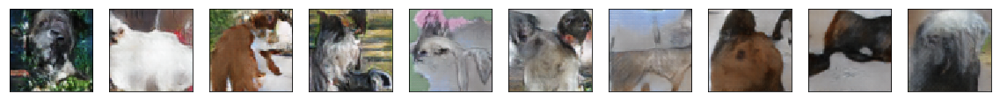

2338.0608191490173
[67/400][328/692] Loss_D: 0.0310 Loss_G: 2.0980 D(x): 0.4095 D(G(z)): -0.0580 / -0.1104
[68/400][136/692] Loss_D: 0.0291 Loss_G: 1.9897 D(x): 0.2033 D(G(z)): -0.2864 / -0.2888
[68/400][636/692] Loss_D: 0.0366 Loss_G: 1.9525 D(x): 0.2302 D(G(z)): -0.1932 / -0.2537
[69/400][444/692] Loss_D: 0.0239 Loss_G: 2.0342 D(x): 0.3617 D(G(z)): -0.1454 / -0.1434
[70/400][252/692] Loss_D: 0.0333 Loss_G: 2.0512 D(x): 0.3521 D(G(z)): -0.1618 / -0.1543
[71/400][60/692] Loss_D: 0.0408 Loss_G: 2.1466 D(x): 0.3526 D(G(z)): -0.1071 / -0.1785
[71/400][560/692] Loss_D: 0.0428 Loss_G: 2.0787 D(x): 0.2908 D(G(z)): -0.1446 / -0.2239


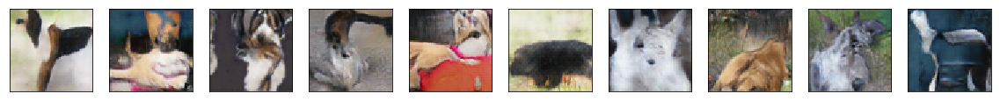

2513.585879087448
[72/400][368/692] Loss_D: 0.0348 Loss_G: 2.0295 D(x): 0.3487 D(G(z)): -0.1557 / -0.1524
[73/400][176/692] Loss_D: 0.0237 Loss_G: 2.0656 D(x): 0.3672 D(G(z)): -0.1282 / -0.1456
[73/400][676/692] Loss_D: 0.0305 Loss_G: 1.7552 D(x): 0.3174 D(G(z)): -0.1533 / -0.1145
[74/400][484/692] Loss_D: 0.0222 Loss_G: 2.0002 D(x): 0.3129 D(G(z)): -0.1853 / -0.1829
[75/400][292/692] Loss_D: 0.0231 Loss_G: 2.0888 D(x): 0.4083 D(G(z)): -0.1181 / -0.1104
[76/400][100/692] Loss_D: 0.0328 Loss_G: 1.9635 D(x): 0.3585 D(G(z)): -0.1030 / -0.1261
[76/400][600/692] Loss_D: 0.0254 Loss_G: 1.9448 D(x): 0.2559 D(G(z)): -0.1950 / -0.2270


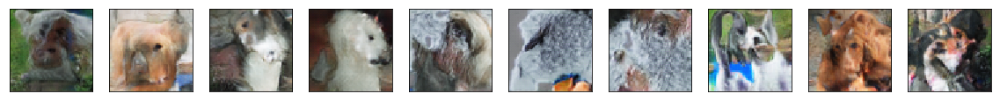

2688.5650560855865
[77/400][408/692] Loss_D: 0.0274 Loss_G: 2.0411 D(x): 0.3353 D(G(z)): -0.1602 / -0.1711
[78/400][216/692] Loss_D: 0.0436 Loss_G: 1.8980 D(x): 0.2451 D(G(z)): -0.1879 / -0.2219
[79/400][24/692] Loss_D: 0.0295 Loss_G: 2.0445 D(x): 0.3785 D(G(z)): -0.1516 / -0.1293
[79/400][524/692] Loss_D: 0.0178 Loss_G: 1.9841 D(x): 0.3432 D(G(z)): -0.1400 / -0.1496
[80/400][332/692] Loss_D: 0.0270 Loss_G: 2.0073 D(x): 0.2943 D(G(z)): -0.1753 / -0.2031
[81/400][140/692] Loss_D: 0.0222 Loss_G: 1.9339 D(x): 0.4033 D(G(z)): -0.0950 / -0.0771
[81/400][640/692] Loss_D: 0.0314 Loss_G: 1.9728 D(x): 0.4078 D(G(z)): -0.0791 / -0.0813


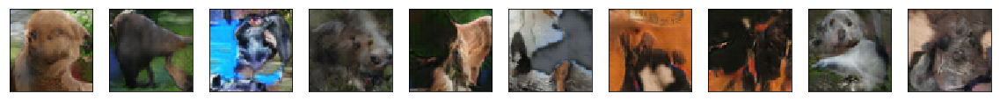

2863.5436477661133
[82/400][448/692] Loss_D: 0.0221 Loss_G: 2.0536 D(x): 0.3126 D(G(z)): -0.2070 / -0.1975
[83/400][256/692] Loss_D: 0.0681 Loss_G: 2.0789 D(x): 0.3212 D(G(z)): -0.0512 / -0.1926
[84/400][64/692] Loss_D: 0.0316 Loss_G: 1.9159 D(x): 0.2982 D(G(z)): -0.1478 / -0.1752
[84/400][564/692] Loss_D: 0.0325 Loss_G: 1.8361 D(x): 0.2876 D(G(z)): -0.1252 / -0.1668
[85/400][372/692] Loss_D: 0.0577 Loss_G: 1.5432 D(x): 0.4096 D(G(z)): -0.2077 / 0.0370
[86/400][180/692] Loss_D: 0.0368 Loss_G: 1.9657 D(x): 0.3251 D(G(z)): -0.1173 / -0.1598
[86/400][680/692] Loss_D: 0.0170 Loss_G: 2.0218 D(x): 0.3564 D(G(z)): -0.1224 / -0.1463


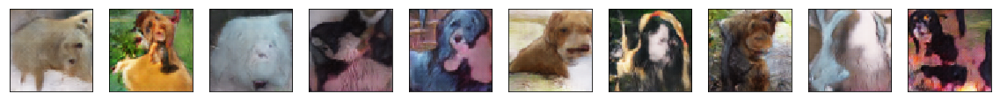

3039.1410496234894
[87/400][488/692] Loss_D: 0.0350 Loss_G: 2.0784 D(x): 0.3056 D(G(z)): -0.1323 / -0.2089
[88/400][296/692] Loss_D: 0.0316 Loss_G: 1.9581 D(x): 0.3058 D(G(z)): -0.1659 / -0.1779
[89/400][104/692] Loss_D: 0.0454 Loss_G: 2.0829 D(x): 0.3267 D(G(z)): -0.0892 / -0.1887
[89/400][604/692] Loss_D: 0.0418 Loss_G: 2.0467 D(x): 0.3029 D(G(z)): -0.1576 / -0.2027
[90/400][412/692] Loss_D: 0.0208 Loss_G: 2.0506 D(x): 0.3686 D(G(z)): -0.1375 / -0.1403
[91/400][220/692] Loss_D: 0.0165 Loss_G: 1.9218 D(x): 0.3857 D(G(z)): -0.1470 / -0.0928


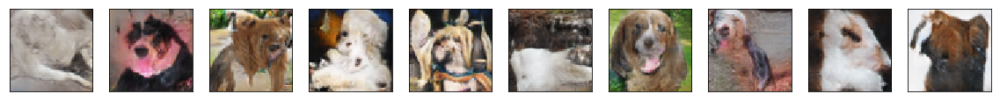

3219.4699699878693
[92/400][28/692] Loss_D: 0.0493 Loss_G: 1.8611 D(x): 0.4195 D(G(z)): 0.0210 / -0.0390
[92/400][528/692] Loss_D: 0.0267 Loss_G: 1.9685 D(x): 0.3718 D(G(z)): -0.0899 / -0.1160
[93/400][336/692] Loss_D: 0.0195 Loss_G: 1.9959 D(x): 0.4156 D(G(z)): -0.0898 / -0.0809
[94/400][144/692] Loss_D: 0.0272 Loss_G: 1.9607 D(x): 0.4645 D(G(z)): 0.0132 / -0.0219
[94/400][644/692] Loss_D: 0.0255 Loss_G: 2.1125 D(x): 0.4194 D(G(z)): -0.1486 / -0.1056
[95/400][452/692] Loss_D: 0.0259 Loss_G: 2.0395 D(x): 0.3193 D(G(z)): -0.1280 / -0.1877
[96/400][260/692] Loss_D: 0.0328 Loss_G: 1.9257 D(x): 0.3638 D(G(z)): -0.0798 / -0.1121


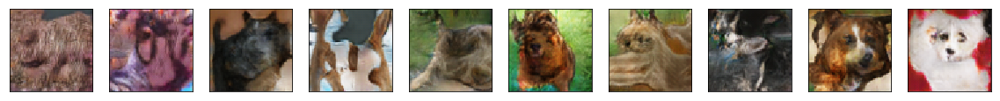

3399.8658776283264
[97/400][68/692] Loss_D: 0.0344 Loss_G: 2.2628 D(x): 0.3784 D(G(z)): -0.0612 / -0.1809
[97/400][568/692] Loss_D: 0.0470 Loss_G: 2.0529 D(x): 0.2399 D(G(z)): -0.1753 / -0.2685
[98/400][376/692] Loss_D: 0.0203 Loss_G: 1.9815 D(x): 0.3806 D(G(z)): -0.0731 / -0.1117
[99/400][184/692] Loss_D: 0.0381 Loss_G: 2.1079 D(x): 0.3234 D(G(z)): -0.1161 / -0.1989
[99/400][684/692] Loss_D: 0.0264 Loss_G: 1.9626 D(x): 0.3921 D(G(z)): -0.0660 / -0.0943
[100/400][492/692] Loss_D: 0.0222 Loss_G: 2.0427 D(x): 0.4290 D(G(z)): -0.0751 / -0.0771
[101/400][300/692] Loss_D: 0.0279 Loss_G: 1.9911 D(x): 0.4048 D(G(z)): -0.0547 / -0.0899


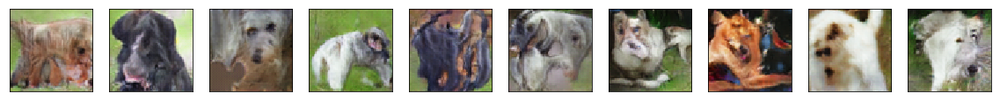

3579.3062114715576
[102/400][108/692] Loss_D: 0.0252 Loss_G: 1.9391 D(x): 0.3948 D(G(z)): -0.0601 / -0.0857
[102/400][608/692] Loss_D: 0.0187 Loss_G: 1.9597 D(x): 0.3840 D(G(z)): -0.0806 / -0.1030
[103/400][416/692] Loss_D: 0.0414 Loss_G: 1.9398 D(x): 0.4294 D(G(z)): -0.1236 / -0.0520
[104/400][224/692] Loss_D: 0.0241 Loss_G: 2.0311 D(x): 0.4352 D(G(z)): -0.0621 / -0.0682
[105/400][32/692] Loss_D: 0.0260 Loss_G: 2.0430 D(x): 0.3742 D(G(z)): -0.0897 / -0.1330
[105/400][532/692] Loss_D: 0.0309 Loss_G: 2.1750 D(x): 0.4389 D(G(z)): -0.0376 / -0.0998
[106/400][340/692] Loss_D: 0.0365 Loss_G: 1.8984 D(x): 0.2817 D(G(z)): -0.1496 / -0.1871


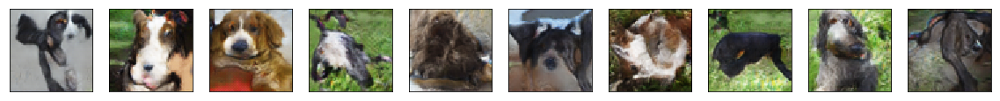

3759.09650015831
[107/400][148/692] Loss_D: 0.0221 Loss_G: 2.0018 D(x): 0.3932 D(G(z)): -0.1475 / -0.1044
[107/400][648/692] Loss_D: 0.0311 Loss_G: 2.0580 D(x): 0.4095 D(G(z)): -0.0979 / -0.1010
[108/400][456/692] Loss_D: 0.0248 Loss_G: 2.0087 D(x): 0.3216 D(G(z)): -0.1646 / -0.1763
[109/400][264/692] Loss_D: 0.0269 Loss_G: 2.0889 D(x): 0.3380 D(G(z)): -0.1343 / -0.1798
[110/400][72/692] Loss_D: 0.0273 Loss_G: 2.0972 D(x): 0.3942 D(G(z)): -0.1371 / -0.1253
[110/400][572/692] Loss_D: 0.0253 Loss_G: 1.9330 D(x): 0.3108 D(G(z)): -0.1351 / -0.1681
[111/400][380/692] Loss_D: 0.0296 Loss_G: 2.0653 D(x): 0.4182 D(G(z)): -0.0394 / -0.0938


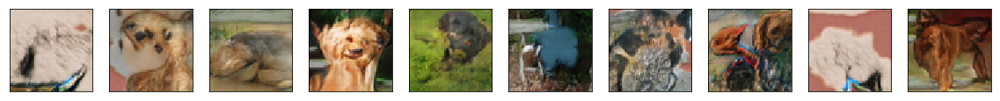

3938.2511701583862
[112/400][188/692] Loss_D: 0.0335 Loss_G: 1.9572 D(x): 0.3503 D(G(z)): -0.0901 / -0.1341
[112/400][688/692] Loss_D: 0.0240 Loss_G: 2.0715 D(x): 0.4406 D(G(z)): -0.0915 / -0.0736
[113/400][496/692] Loss_D: 0.0329 Loss_G: 1.9795 D(x): 0.3160 D(G(z)): -0.1081 / -0.1751
[114/400][304/692] Loss_D: 0.0233 Loss_G: 2.0012 D(x): 0.4022 D(G(z)): -0.0766 / -0.0944
[115/400][112/692] Loss_D: 0.0233 Loss_G: 2.0069 D(x): 0.3263 D(G(z)): -0.1488 / -0.1718
[115/400][612/692] Loss_D: 0.0231 Loss_G: 2.0378 D(x): 0.4303 D(G(z)): -0.0359 / -0.0755
[116/400][420/692] Loss_D: 0.0183 Loss_G: 2.0093 D(x): 0.3710 D(G(z)): -0.1072 / -0.1280


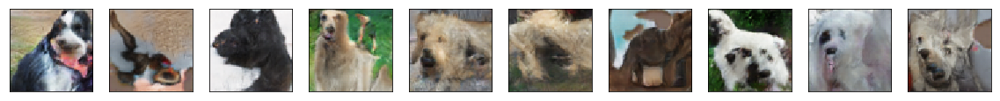

4118.675897836685
[117/400][228/692] Loss_D: 0.0191 Loss_G: 2.0275 D(x): 0.3729 D(G(z)): -0.1293 / -0.1313
[118/400][36/692] Loss_D: 0.0231 Loss_G: 1.9725 D(x): 0.4098 D(G(z)): -0.0605 / -0.0791
[118/400][536/692] Loss_D: 0.0273 Loss_G: 1.9210 D(x): 0.3732 D(G(z)): -0.0853 / -0.1022
[119/400][344/692] Loss_D: 0.0202 Loss_G: 2.0500 D(x): 0.4736 D(G(z)): -0.0284 / -0.0364
[120/400][152/692] Loss_D: 0.0178 Loss_G: 1.9408 D(x): 0.3775 D(G(z)): -0.0908 / -0.1046
[120/400][652/692] Loss_D: 0.0196 Loss_G: 1.8915 D(x): 0.3497 D(G(z)): -0.0956 / -0.1202
[121/400][460/692] Loss_D: 0.0205 Loss_G: 2.0637 D(x): 0.4310 D(G(z)): -0.0596 / -0.0820


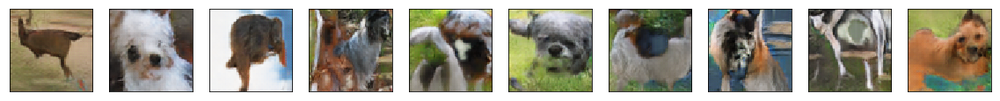

4299.230340003967
[122/400][268/692] Loss_D: 0.0261 Loss_G: 1.9390 D(x): 0.3496 D(G(z)): -0.1005 / -0.1312
[123/400][76/692] Loss_D: 0.0275 Loss_G: 1.9847 D(x): 0.4749 D(G(z)): -0.0949 / -0.0191
[123/400][576/692] Loss_D: 0.0268 Loss_G: 1.9959 D(x): 0.3739 D(G(z)): -0.1106 / -0.1214
[124/400][384/692] Loss_D: 0.0264 Loss_G: 2.0346 D(x): 0.4223 D(G(z)): -0.0861 / -0.0819
[125/400][192/692] Loss_D: 0.0263 Loss_G: 2.0469 D(x): 0.4485 D(G(z)): -0.0642 / -0.0590
[126/400][0/692] Loss_D: 0.0418 Loss_G: 2.1538 D(x): 0.3866 D(G(z)): -0.0403 / -0.1472
[126/400][500/692] Loss_D: 0.0212 Loss_G: 1.9973 D(x): 0.4051 D(G(z)): -0.0863 / -0.0902


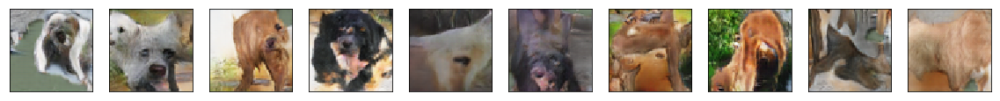

4479.220294237137
[127/400][308/692] Loss_D: 0.0191 Loss_G: 2.0329 D(x): 0.3950 D(G(z)): -0.1186 / -0.1108
[128/400][116/692] Loss_D: 0.0211 Loss_G: 1.9806 D(x): 0.3907 D(G(z)): -0.0819 / -0.1009
[128/400][616/692] Loss_D: 0.0295 Loss_G: 1.9295 D(x): 0.3388 D(G(z)): -0.0937 / -0.1397
[129/400][424/692] Loss_D: 0.0274 Loss_G: 2.0066 D(x): 0.3925 D(G(z)): -0.0909 / -0.1059
[130/400][232/692] Loss_D: 0.0212 Loss_G: 1.9379 D(x): 0.3475 D(G(z)): -0.1086 / -0.1339
[131/400][40/692] Loss_D: 0.0221 Loss_G: 2.0915 D(x): 0.4119 D(G(z)): -0.0708 / -0.1085
[131/400][540/692] Loss_D: 0.0185 Loss_G: 2.0365 D(x): 0.3837 D(G(z)): -0.0770 / -0.1227


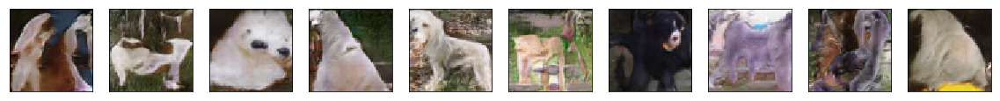

4660.230015039444
[132/400][348/692] Loss_D: 0.0206 Loss_G: 1.9546 D(x): 0.3954 D(G(z)): -0.0757 / -0.0905
[133/400][156/692] Loss_D: 0.0212 Loss_G: 2.0707 D(x): 0.5001 D(G(z)): -0.0024 / -0.0146
[133/400][656/692] Loss_D: 0.0318 Loss_G: 2.1769 D(x): 0.3460 D(G(z)): -0.0680 / -0.1944
[134/400][464/692] Loss_D: 0.0290 Loss_G: 1.9074 D(x): 0.3108 D(G(z)): -0.1213 / -0.1619
[135/400][272/692] Loss_D: 0.0298 Loss_G: 2.1322 D(x): 0.4463 D(G(z)): -0.0516 / -0.0811
[136/400][80/692] Loss_D: 0.0194 Loss_G: 1.9380 D(x): 0.4060 D(G(z)): -0.0474 / -0.0757
[136/400][580/692] Loss_D: 0.0206 Loss_G: 2.0874 D(x): 0.4297 D(G(z)): -0.1014 / -0.0887


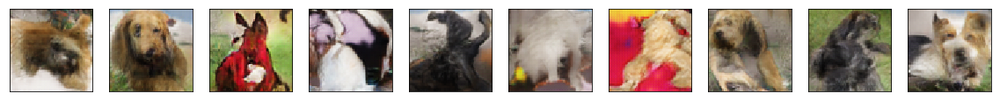

4840.90740275383
[137/400][388/692] Loss_D: 0.0281 Loss_G: 2.0579 D(x): 0.4034 D(G(z)): -0.0383 / -0.1081
[138/400][196/692] Loss_D: 0.0254 Loss_G: 1.9489 D(x): 0.3932 D(G(z)): -0.0745 / -0.0892
[139/400][4/692] Loss_D: 0.0263 Loss_G: 2.0294 D(x): 0.4024 D(G(z)): -0.1140 / -0.1016
[139/400][504/692] Loss_D: 0.0296 Loss_G: 2.0658 D(x): 0.4709 D(G(z)): 0.0112 / -0.0425
[140/400][312/692] Loss_D: 0.0178 Loss_G: 2.0205 D(x): 0.4429 D(G(z)): -0.0595 / -0.0588
[141/400][120/692] Loss_D: 0.0215 Loss_G: 2.0418 D(x): 0.4943 D(G(z)): -0.0243 / -0.0138
[141/400][620/692] Loss_D: 0.0226 Loss_G: 2.0321 D(x): 0.4142 D(G(z)): -0.0547 / -0.0919


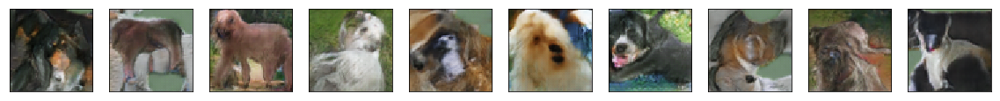

5021.5584506988525
[142/400][428/692] Loss_D: 0.0204 Loss_G: 1.9709 D(x): 0.4106 D(G(z)): -0.0552 / -0.0789
[143/400][236/692] Loss_D: 0.0263 Loss_G: 2.0286 D(x): 0.3856 D(G(z)): -0.1042 / -0.1177
[144/400][44/692] Loss_D: 0.0132 Loss_G: 2.0091 D(x): 0.3579 D(G(z)): -0.1506 / -0.1419
[144/400][544/692] Loss_D: 0.0228 Loss_G: 1.9158 D(x): 0.3712 D(G(z)): -0.0746 / -0.1045
[145/400][352/692] Loss_D: 0.0205 Loss_G: 2.0515 D(x): 0.4883 D(G(z)): -0.0328 / -0.0211
[146/400][160/692] Loss_D: 0.0263 Loss_G: 2.0260 D(x): 0.3776 D(G(z)): -0.1183 / -0.1238
[146/400][660/692] Loss_D: 0.0219 Loss_G: 2.0080 D(x): 0.3970 D(G(z)): -0.0932 / -0.1009


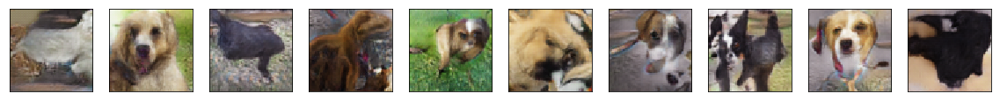

5202.101563453674
[147/400][468/692] Loss_D: 0.0175 Loss_G: 2.0027 D(x): 0.3913 D(G(z)): -0.0869 / -0.1071
[148/400][276/692] Loss_D: 0.0188 Loss_G: 1.9561 D(x): 0.4734 D(G(z)): -0.0007 / -0.0123
[149/400][84/692] Loss_D: 0.0216 Loss_G: 1.9855 D(x): 0.4415 D(G(z)): -0.0529 / -0.0523
[149/400][584/692] Loss_D: 0.0220 Loss_G: 2.0404 D(x): 0.4378 D(G(z)): -0.0195 / -0.0702
[150/400][392/692] Loss_D: 0.0128 Loss_G: 2.0592 D(x): 0.4432 D(G(z)): -0.0757 / -0.0693
[151/400][200/692] Loss_D: 0.0241 Loss_G: 2.0273 D(x): 0.4741 D(G(z)): -0.0085 / -0.0290


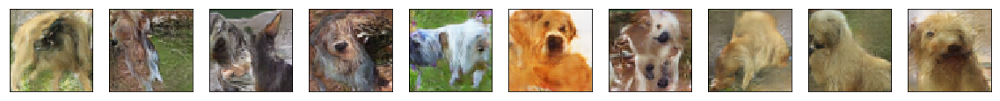

5382.418079614639
[152/400][8/692] Loss_D: 0.0258 Loss_G: 1.9617 D(x): 0.3901 D(G(z)): -0.0905 / -0.0956
[152/400][508/692] Loss_D: 0.0160 Loss_G: 2.0115 D(x): 0.4463 D(G(z)): -0.0535 / -0.0536
[153/400][316/692] Loss_D: 0.0161 Loss_G: 2.0052 D(x): 0.4407 D(G(z)): -0.0236 / -0.0590
[154/400][124/692] Loss_D: 0.0135 Loss_G: 1.9801 D(x): 0.4486 D(G(z)): -0.0297 / -0.0440
[154/400][624/692] Loss_D: 0.0248 Loss_G: 2.0246 D(x): 0.4628 D(G(z)): -0.0238 / -0.0386
[155/400][432/692] Loss_D: 0.0249 Loss_G: 2.0903 D(x): 0.4512 D(G(z)): -0.0169 / -0.0679
[156/400][240/692] Loss_D: 0.0144 Loss_G: 1.9464 D(x): 0.4212 D(G(z)): -0.0513 / -0.0628


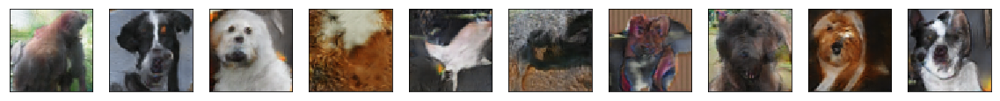

5563.415863037109
[157/400][48/692] Loss_D: 0.0126 Loss_G: 2.0192 D(x): 0.4853 D(G(z)): -0.0086 / -0.0179
[157/400][548/692] Loss_D: 0.0155 Loss_G: 1.9804 D(x): 0.5337 D(G(z)): 0.0541 / 0.0408
[158/400][356/692] Loss_D: 0.0184 Loss_G: 2.0785 D(x): 0.5052 D(G(z)): -0.0224 / -0.0116
[159/400][164/692] Loss_D: 0.0171 Loss_G: 2.0071 D(x): 0.4534 D(G(z)): -0.0484 / -0.0463
[159/400][664/692] Loss_D: 0.0182 Loss_G: 2.0379 D(x): 0.5443 D(G(z)): 0.0233 / 0.0374
[160/400][472/692] Loss_D: 0.0192 Loss_G: 1.9776 D(x): 0.4791 D(G(z)): -0.0110 / -0.0119
[161/400][280/692] Loss_D: 0.0263 Loss_G: 2.0021 D(x): 0.4915 D(G(z)): 0.0445 / -0.0067


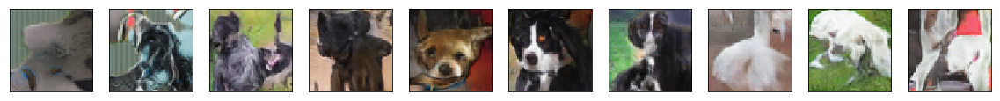

5743.874542951584
[162/400][88/692] Loss_D: 0.0203 Loss_G: 1.9830 D(x): 0.4487 D(G(z)): -0.0321 / -0.0431
[162/400][588/692] Loss_D: 0.0184 Loss_G: 1.9920 D(x): 0.4571 D(G(z)): -0.0242 / -0.0376
[163/400][396/692] Loss_D: 0.0230 Loss_G: 2.0334 D(x): 0.4701 D(G(z)): -0.0166 / -0.0355
[164/400][204/692] Loss_D: 0.0232 Loss_G: 1.9606 D(x): 0.4070 D(G(z)): -0.0469 / -0.0793
[165/400][12/692] Loss_D: 0.0268 Loss_G: 2.2354 D(x): 0.4320 D(G(z)): -0.0095 / -0.1225
[165/400][512/692] Loss_D: 0.0171 Loss_G: 2.0014 D(x): 0.4650 D(G(z)): -0.0396 / -0.0333
[166/400][320/692] Loss_D: 0.0138 Loss_G: 2.0223 D(x): 0.5000 D(G(z)): 0.0002 / -0.0032


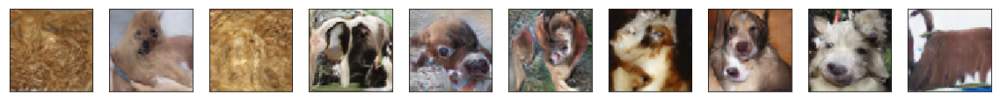

5925.137491703033
[167/400][128/692] Loss_D: 0.0178 Loss_G: 2.0213 D(x): 0.5156 D(G(z)): 0.0461 / 0.0122
[167/400][628/692] Loss_D: 0.0288 Loss_G: 1.9995 D(x): 0.4525 D(G(z)): -0.0009 / -0.0438
[168/400][436/692] Loss_D: 0.0113 Loss_G: 1.9785 D(x): 0.4378 D(G(z)): -0.0502 / -0.0548
[169/400][244/692] Loss_D: 0.0163 Loss_G: 2.0070 D(x): 0.4598 D(G(z)): -0.0237 / -0.0396
[170/400][52/692] Loss_D: 0.0164 Loss_G: 1.9917 D(x): 0.4860 D(G(z)): 0.0038 / -0.0090
[170/400][552/692] Loss_D: 0.0151 Loss_G: 2.0308 D(x): 0.5288 D(G(z)): 0.0216 / 0.0239
[171/400][360/692] Loss_D: 0.0154 Loss_G: 1.9769 D(x): 0.5268 D(G(z)): 0.0509 / 0.0344


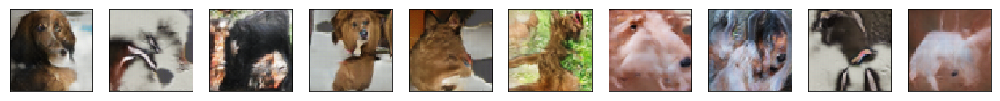

6105.0217270851135
[172/400][168/692] Loss_D: 0.0256 Loss_G: 1.9095 D(x): 0.4517 D(G(z)): 0.0078 / -0.0218
[172/400][668/692] Loss_D: 0.0130 Loss_G: 2.0473 D(x): 0.5246 D(G(z)): 0.0099 / 0.0149
[173/400][476/692] Loss_D: 0.0202 Loss_G: 2.1003 D(x): 0.4836 D(G(z)): 0.0096 / -0.0383
[174/400][284/692] Loss_D: 0.0148 Loss_G: 2.0020 D(x): 0.4480 D(G(z)): -0.0444 / -0.0498
[175/400][92/692] Loss_D: 0.0213 Loss_G: 2.0118 D(x): 0.4865 D(G(z)): 0.0042 / -0.0135
[175/400][592/692] Loss_D: 0.0158 Loss_G: 2.0643 D(x): 0.5080 D(G(z)): 0.0130 / -0.0060
[176/400][400/692] Loss_D: 0.0219 Loss_G: 1.9824 D(x): 0.4950 D(G(z)): 0.0102 / 0.0033


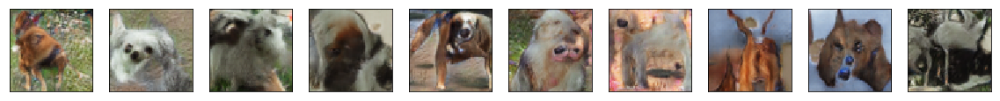

6285.833522796631
[177/400][208/692] Loss_D: 0.0152 Loss_G: 2.0406 D(x): 0.4798 D(G(z)): 0.0157 / -0.0284
[178/400][16/692] Loss_D: 0.0224 Loss_G: 2.0939 D(x): 0.4938 D(G(z)): -0.0453 / -0.0263
[178/400][516/692] Loss_D: 0.0125 Loss_G: 2.0360 D(x): 0.4703 D(G(z)): -0.0312 / -0.0364
[179/400][324/692] Loss_D: 0.0264 Loss_G: 2.0462 D(x): 0.4737 D(G(z)): 0.0515 / -0.0353
[180/400][132/692] Loss_D: 0.0169 Loss_G: 2.0472 D(x): 0.5386 D(G(z)): 0.0206 / 0.0296
[180/400][632/692] Loss_D: 0.0166 Loss_G: 1.9455 D(x): 0.4536 D(G(z)): -0.0181 / -0.0302
[181/400][440/692] Loss_D: 0.0205 Loss_G: 2.0472 D(x): 0.4131 D(G(z)): -0.0963 / -0.0958


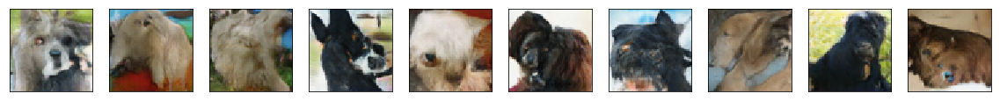

6466.102093696594
[182/400][248/692] Loss_D: 0.0200 Loss_G: 1.9617 D(x): 0.4773 D(G(z)): 0.0132 / -0.0100
[183/400][56/692] Loss_D: 0.0179 Loss_G: 2.0250 D(x): 0.5031 D(G(z)): 0.0123 / -0.0008
[183/400][556/692] Loss_D: 0.0166 Loss_G: 2.0247 D(x): 0.5250 D(G(z)): 0.0167 / 0.0212
[184/400][364/692] Loss_D: 0.0162 Loss_G: 2.0200 D(x): 0.4858 D(G(z)): -0.0249 / -0.0161
[185/400][172/692] Loss_D: 0.0241 Loss_G: 2.0852 D(x): 0.5320 D(G(z)): 0.0645 / 0.0133
[185/400][672/692] Loss_D: 0.0202 Loss_G: 1.9908 D(x): 0.3926 D(G(z)): -0.1127 / -0.1023
[186/400][480/692] Loss_D: 0.0184 Loss_G: 2.0993 D(x): 0.4986 D(G(z)): -0.0515 / -0.0237


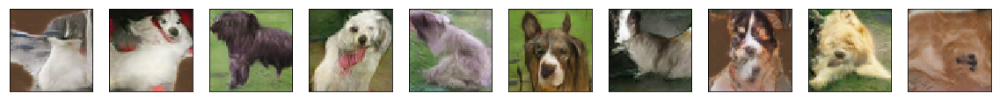

6646.426358222961
[187/400][288/692] Loss_D: 0.0206 Loss_G: 1.9906 D(x): 0.4577 D(G(z)): -0.0572 / -0.0369
[188/400][96/692] Loss_D: 0.0180 Loss_G: 2.0747 D(x): 0.4505 D(G(z)): -0.0882 / -0.0653
[188/400][596/692] Loss_D: 0.0273 Loss_G: 1.9108 D(x): 0.4058 D(G(z)): -0.0380 / -0.0672
[189/400][404/692] Loss_D: 0.0248 Loss_G: 2.0698 D(x): 0.5497 D(G(z)): 0.0627 / 0.0356
[190/400][212/692] Loss_D: 0.0171 Loss_G: 2.0895 D(x): 0.5102 D(G(z)): -0.0115 / -0.0091
[191/400][20/692] Loss_D: 0.0298 Loss_G: 2.0127 D(x): 0.4804 D(G(z)): 0.0597 / -0.0205
[191/400][520/692] Loss_D: 0.0175 Loss_G: 2.0385 D(x): 0.6230 D(G(z)): 0.0838 / 0.1160


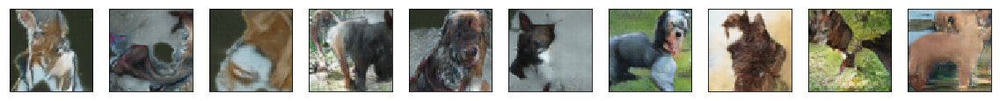

6827.0841500759125
[192/400][328/692] Loss_D: 0.0142 Loss_G: 2.0305 D(x): 0.4964 D(G(z)): -0.0052 / -0.0088
[193/400][136/692] Loss_D: 0.0275 Loss_G: 2.1424 D(x): 0.5427 D(G(z)): 0.1201 / 0.0091
[193/400][636/692] Loss_D: 0.0147 Loss_G: 2.0109 D(x): 0.5216 D(G(z)): 0.0147 / 0.0207
[194/400][444/692] Loss_D: 0.0133 Loss_G: 2.0328 D(x): 0.5191 D(G(z)): 0.0154 / 0.0134
[195/400][252/692] Loss_D: 0.0178 Loss_G: 2.0485 D(x): 0.5564 D(G(z)): 0.0500 / 0.0468
[196/400][60/692] Loss_D: 0.0246 Loss_G: 1.9272 D(x): 0.4387 D(G(z)): -0.0116 / -0.0392
[196/400][560/692] Loss_D: 0.0230 Loss_G: 1.8781 D(x): 0.4745 D(G(z)): 0.0363 / 0.0086


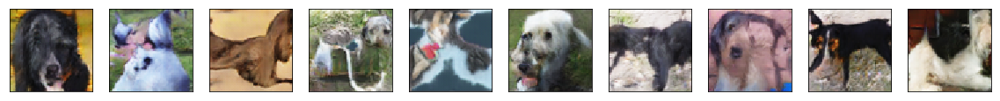

7006.716297864914
[197/400][368/692] Loss_D: 0.0144 Loss_G: 2.0223 D(x): 0.5266 D(G(z)): 0.0329 / 0.0226
[198/400][176/692] Loss_D: 0.0114 Loss_G: 2.0603 D(x): 0.5168 D(G(z)): -0.0063 / 0.0037
[198/400][676/692] Loss_D: 0.0153 Loss_G: 1.9887 D(x): 0.4632 D(G(z)): -0.0171 / -0.0313
[199/400][484/692] Loss_D: 0.0168 Loss_G: 2.0385 D(x): 0.5317 D(G(z)): 0.0260 / 0.0240
[200/400][292/692] Loss_D: 0.0203 Loss_G: 1.9700 D(x): 0.4771 D(G(z)): -0.0052 / -0.0120
[201/400][100/692] Loss_D: 0.0133 Loss_G: 2.0087 D(x): 0.5059 D(G(z)): 0.0062 / 0.0056
[201/400][600/692] Loss_D: 0.0275 Loss_G: 2.0870 D(x): 0.5252 D(G(z)): 0.0802 / 0.0072


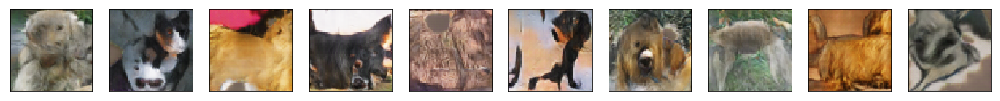

7187.1120591163635
[202/400][408/692] Loss_D: 0.0265 Loss_G: 1.8682 D(x): 0.4391 D(G(z)): 0.0066 / -0.0237
[203/400][216/692] Loss_D: 0.0152 Loss_G: 2.0365 D(x): 0.4945 D(G(z)): 0.0239 / -0.0129
[204/400][24/692] Loss_D: 0.0140 Loss_G: 1.9834 D(x): 0.4635 D(G(z)): -0.0112 / -0.0301
[204/400][524/692] Loss_D: 0.0172 Loss_G: 1.9330 D(x): 0.4497 D(G(z)): 0.0012 / -0.0312
[205/400][332/692] Loss_D: 0.0183 Loss_G: 1.9807 D(x): 0.5050 D(G(z)): 0.0206 / 0.0121
[206/400][140/692] Loss_D: 0.0186 Loss_G: 1.9962 D(x): 0.5253 D(G(z)): 0.0485 / 0.0292
[206/400][640/692] Loss_D: 0.0125 Loss_G: 2.0400 D(x): 0.5240 D(G(z)): 0.0139 / 0.0162


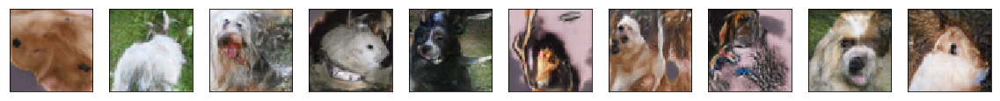

7367.9920082092285
[207/400][448/692] Loss_D: 0.0187 Loss_G: 2.0194 D(x): 0.5531 D(G(z)): 0.0563 / 0.0516
[208/400][256/692] Loss_D: 0.0174 Loss_G: 1.9292 D(x): 0.4418 D(G(z)): -0.0205 / -0.0375
[209/400][64/692] Loss_D: 0.0134 Loss_G: 2.0510 D(x): 0.6055 D(G(z)): 0.1106 / 0.0948
[209/400][564/692] Loss_D: 0.0147 Loss_G: 2.0400 D(x): 0.5222 D(G(z)): 0.0296 / 0.0141
[210/400][372/692] Loss_D: 0.0171 Loss_G: 2.0037 D(x): 0.5216 D(G(z)): 0.0387 / 0.0239
[211/400][180/692] Loss_D: 0.0173 Loss_G: 2.0286 D(x): 0.5277 D(G(z)): 0.0598 / 0.0228
[211/400][680/692] Loss_D: 0.0160 Loss_G: 2.0254 D(x): 0.6024 D(G(z)): 0.0989 / 0.0981


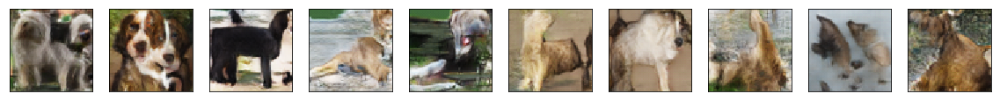

7548.168525934219
[212/400][488/692] Loss_D: 0.0167 Loss_G: 1.9672 D(x): 0.5185 D(G(z)): 0.0349 / 0.0297
[213/400][296/692] Loss_D: 0.0249 Loss_G: 2.0318 D(x): 0.5667 D(G(z)): 0.0989 / 0.0622
[214/400][104/692] Loss_D: 0.0203 Loss_G: 2.0853 D(x): 0.5330 D(G(z)): -0.0023 / 0.0148
[214/400][604/692] Loss_D: 0.0141 Loss_G: 2.0155 D(x): 0.5740 D(G(z)): 0.0781 / 0.0727
[215/400][412/692] Loss_D: 0.0247 Loss_G: 2.1477 D(x): 0.5575 D(G(z)): 0.1320 / 0.0232
[216/400][220/692] Loss_D: 0.0176 Loss_G: 1.9804 D(x): 0.5422 D(G(z)): 0.0575 / 0.0500


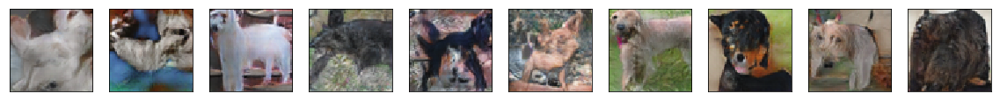

7729.0051329135895
[217/400][28/692] Loss_D: 0.0146 Loss_G: 1.9724 D(x): 0.5232 D(G(z)): 0.0169 / 0.0323
[217/400][528/692] Loss_D: 0.0139 Loss_G: 2.0342 D(x): 0.5774 D(G(z)): 0.1123 / 0.0701
[218/400][336/692] Loss_D: 0.0163 Loss_G: 1.9405 D(x): 0.5102 D(G(z)): 0.0463 / 0.0281
[219/400][144/692] Loss_D: 0.0185 Loss_G: 2.0176 D(x): 0.5425 D(G(z)): 0.0667 / 0.0407
[219/400][644/692] Loss_D: 0.0245 Loss_G: 1.9933 D(x): 0.5980 D(G(z)): 0.0927 / 0.1019
[220/400][452/692] Loss_D: 0.0110 Loss_G: 2.0610 D(x): 0.5796 D(G(z)): 0.0624 / 0.0665
[221/400][260/692] Loss_D: 0.0214 Loss_G: 2.0417 D(x): 0.5914 D(G(z)): 0.1237 / 0.0833


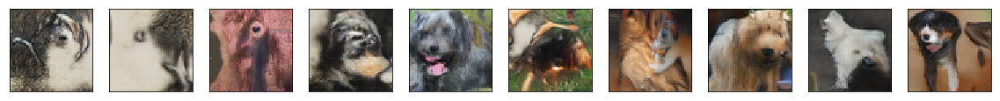

7908.524646520615
[222/400][68/692] Loss_D: 0.0189 Loss_G: 1.9194 D(x): 0.5695 D(G(z)): 0.1126 / 0.0932
[222/400][568/692] Loss_D: 0.0207 Loss_G: 1.9169 D(x): 0.5507 D(G(z)): 0.1012 / 0.0748
[223/400][376/692] Loss_D: 0.0240 Loss_G: 2.0263 D(x): 0.6327 D(G(z)): 0.1682 / 0.1290
[224/400][184/692] Loss_D: 0.0180 Loss_G: 1.9444 D(x): 0.5294 D(G(z)): 0.0552 / 0.0467
[224/400][684/692] Loss_D: 0.0111 Loss_G: 1.9741 D(x): 0.5565 D(G(z)): 0.0802 / 0.0647
[225/400][492/692] Loss_D: 0.0211 Loss_G: 2.0061 D(x): 0.5625 D(G(z)): 0.1012 / 0.0638
[226/400][300/692] Loss_D: 0.0259 Loss_G: 2.1617 D(x): 0.5739 D(G(z)): 0.0079 / 0.0369


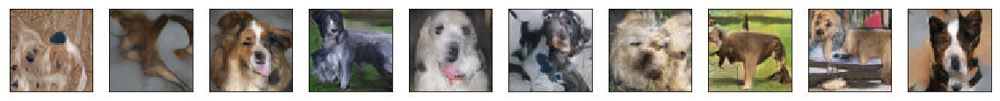

8088.528637647629
[227/400][108/692] Loss_D: 0.0180 Loss_G: 2.0153 D(x): 0.5521 D(G(z)): 0.0837 / 0.0504
[227/400][608/692] Loss_D: 0.0202 Loss_G: 2.0437 D(x): 0.6067 D(G(z)): 0.0640 / 0.0985
[228/400][416/692] Loss_D: 0.0176 Loss_G: 1.9794 D(x): 0.5320 D(G(z)): 0.0777 / 0.0396
[229/400][224/692] Loss_D: 0.0205 Loss_G: 1.9860 D(x): 0.5585 D(G(z)): 0.0569 / 0.0645
[230/400][32/692] Loss_D: 0.0217 Loss_G: 1.8281 D(x): 0.5426 D(G(z)): 0.1213 / 0.0883
[230/400][532/692] Loss_D: 0.0152 Loss_G: 1.9310 D(x): 0.5785 D(G(z)): 0.1113 / 0.0983
[231/400][340/692] Loss_D: 0.0142 Loss_G: 2.0215 D(x): 0.5885 D(G(z)): 0.1151 / 0.0846


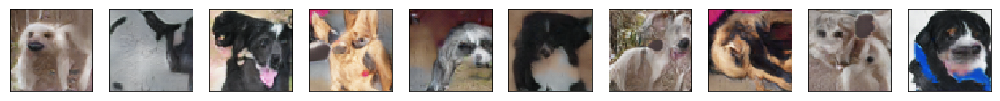

8269.196945667267
[232/400][148/692] Loss_D: 0.0231 Loss_G: 1.9860 D(x): 0.5338 D(G(z)): 0.0494 / 0.0418
[232/400][648/692] Loss_D: 0.0116 Loss_G: 1.9975 D(x): 0.5398 D(G(z)): 0.0513 / 0.0426
[233/400][456/692] Loss_D: 0.0216 Loss_G: 2.0566 D(x): 0.5573 D(G(z)): 0.0797 / 0.0458
[234/400][264/692] Loss_D: 0.0159 Loss_G: 1.9317 D(x): 0.5656 D(G(z)): 0.1081 / 0.0849
[235/400][72/692] Loss_D: 0.0142 Loss_G: 2.0150 D(x): 0.6690 D(G(z)): 0.1765 / 0.1673
[235/400][572/692] Loss_D: 0.0197 Loss_G: 1.9495 D(x): 0.5399 D(G(z)): 0.0971 / 0.0543
[236/400][380/692] Loss_D: 0.0134 Loss_G: 1.9948 D(x): 0.5326 D(G(z)): 0.0356 / 0.0364


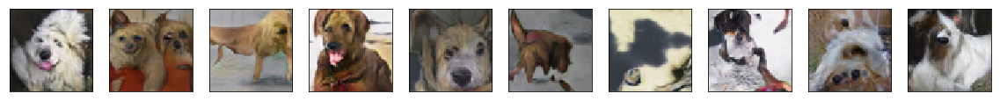

8449.221462726593
[237/400][188/692] Loss_D: 0.0200 Loss_G: 2.0935 D(x): 0.6188 D(G(z)): 0.1448 / 0.0980
[237/400][688/692] Loss_D: 0.0147 Loss_G: 2.0048 D(x): 0.6643 D(G(z)): 0.1690 / 0.1650
[238/400][496/692] Loss_D: 0.0110 Loss_G: 2.0415 D(x): 0.5922 D(G(z)): 0.0757 / 0.0836
[239/400][304/692] Loss_D: 0.0138 Loss_G: 1.9362 D(x): 0.6015 D(G(z)): 0.0734 / 0.1190
[240/400][112/692] Loss_D: 0.0165 Loss_G: 2.0052 D(x): 0.6597 D(G(z)): 0.1730 / 0.1612
[240/400][612/692] Loss_D: 0.0105 Loss_G: 1.9804 D(x): 0.5898 D(G(z)): 0.1050 / 0.0966
[241/400][420/692] Loss_D: 0.0124 Loss_G: 1.9832 D(x): 0.6600 D(G(z)): 0.1131 / 0.1654


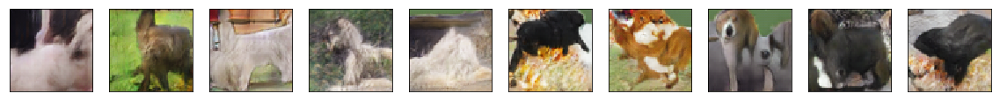

8629.88799738884
[242/400][228/692] Loss_D: 0.0185 Loss_G: 1.9278 D(x): 0.5917 D(G(z)): 0.1318 / 0.1128
[243/400][36/692] Loss_D: 0.0163 Loss_G: 2.0207 D(x): 0.6095 D(G(z)): 0.1002 / 0.1061
[243/400][536/692] Loss_D: 0.0140 Loss_G: 2.0172 D(x): 0.6783 D(G(z)): 0.1840 / 0.1754
[244/400][344/692] Loss_D: 0.0208 Loss_G: 1.9057 D(x): 0.6245 D(G(z)): 0.1875 / 0.1511
[245/400][152/692] Loss_D: 0.0117 Loss_G: 2.0093 D(x): 0.6750 D(G(z)): 0.1643 / 0.1742
[245/400][652/692] Loss_D: 0.0188 Loss_G: 2.0007 D(x): 0.6323 D(G(z)): 0.1254 / 0.1346
[246/400][460/692] Loss_D: 0.0095 Loss_G: 2.0136 D(x): 0.6449 D(G(z)): 0.1476 / 0.1433


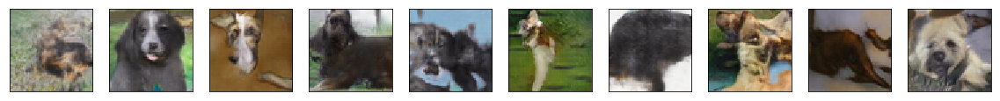

8810.375471830368
[247/400][268/692] Loss_D: 0.0173 Loss_G: 2.1312 D(x): 0.6642 D(G(z)): 0.1883 / 0.1342
[248/400][76/692] Loss_D: 0.0174 Loss_G: 1.9493 D(x): 0.5782 D(G(z)): 0.1109 / 0.0938
[248/400][576/692] Loss_D: 0.0141 Loss_G: 1.9343 D(x): 0.5629 D(G(z)): 0.0993 / 0.0817
[249/400][384/692] Loss_D: 0.0144 Loss_G: 2.0153 D(x): 0.6686 D(G(z)): 0.1678 / 0.1669
[250/400][192/692] Loss_D: 0.0194 Loss_G: 1.9459 D(x): 0.6119 D(G(z)): 0.1544 / 0.1286
[251/400][0/692] Loss_D: 0.0173 Loss_G: 1.9611 D(x): 0.5553 D(G(z)): 0.0864 / 0.0681
[251/400][500/692] Loss_D: 0.0142 Loss_G: 2.0358 D(x): 0.6355 D(G(z)): 0.1341 / 0.1284


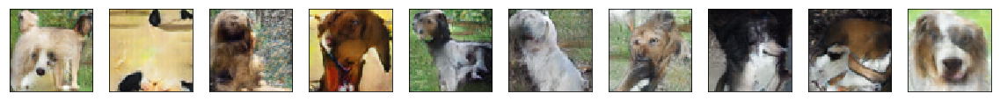

8990.552647590637
[252/400][308/692] Loss_D: 0.0196 Loss_G: 1.8746 D(x): 0.6077 D(G(z)): 0.1732 / 0.1415
[253/400][116/692] Loss_D: 0.0138 Loss_G: 2.0141 D(x): 0.6969 D(G(z)): 0.1610 / 0.1950
[253/400][616/692] Loss_D: 0.0264 Loss_G: 2.0093 D(x): 0.6268 D(G(z)): 0.1968 / 0.1272
[254/400][424/692] Loss_D: 0.0131 Loss_G: 1.9857 D(x): 0.6292 D(G(z)): 0.1460 / 0.1353
[255/400][232/692] Loss_D: 0.0117 Loss_G: 2.0063 D(x): 0.6815 D(G(z)): 0.1709 / 0.1813
[256/400][40/692] Loss_D: 0.0192 Loss_G: 1.9076 D(x): 0.6282 D(G(z)): 0.1785 / 0.1544
[256/400][540/692] Loss_D: 0.0144 Loss_G: 2.0716 D(x): 0.6990 D(G(z)): 0.1606 / 0.1832


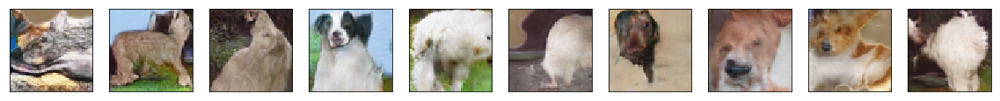

9171.315124988556
[257/400][348/692] Loss_D: 0.0152 Loss_G: 2.0174 D(x): 0.7044 D(G(z)): 0.2221 / 0.2019
[258/400][156/692] Loss_D: 0.0205 Loss_G: 1.9224 D(x): 0.6473 D(G(z)): 0.1924 / 0.1698
[258/400][656/692] Loss_D: 0.0156 Loss_G: 1.9694 D(x): 0.6766 D(G(z)): 0.2000 / 0.1869
[259/400][464/692] Loss_D: 0.0191 Loss_G: 2.0414 D(x): 0.7146 D(G(z)): 0.2471 / 0.2064
[260/400][272/692] Loss_D: 0.0063 Loss_G: 2.0060 D(x): 0.6878 D(G(z)): 0.1857 / 0.1875
[261/400][80/692] Loss_D: 0.0334 Loss_G: 2.0108 D(x): 0.6046 D(G(z)): 0.1767 / 0.1057
[261/400][580/692] Loss_D: 0.0159 Loss_G: 2.0071 D(x): 0.6562 D(G(z)): 0.2069 / 0.1560


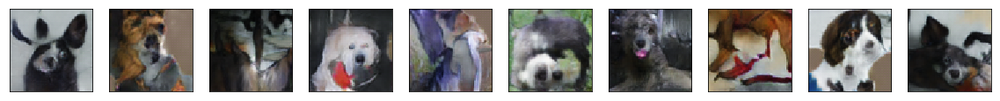

9351.000804662704
[262/400][388/692] Loss_D: 0.0139 Loss_G: 2.0761 D(x): 0.6728 D(G(z)): 0.1443 / 0.1559
[263/400][196/692] Loss_D: 0.0256 Loss_G: 2.0433 D(x): 0.5453 D(G(z)): 0.1135 / 0.0371
[264/400][4/692] Loss_D: 0.0210 Loss_G: 2.0050 D(x): 0.7660 D(G(z)): 0.2996 / 0.2681
[264/400][504/692] Loss_D: 0.0088 Loss_G: 2.0485 D(x): 0.6805 D(G(z)): 0.1641 / 0.1700
[265/400][312/692] Loss_D: 0.0195 Loss_G: 2.0291 D(x): 0.7291 D(G(z)): 0.2329 / 0.2245
[266/400][120/692] Loss_D: 0.0216 Loss_G: 1.9193 D(x): 0.6301 D(G(z)): 0.1845 / 0.1538
[266/400][620/692] Loss_D: 0.0138 Loss_G: 1.9370 D(x): 0.6490 D(G(z)): 0.1874 / 0.1668


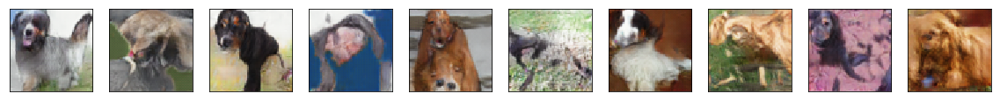

9531.913711309433
[267/400][428/692] Loss_D: 0.0178 Loss_G: 2.0227 D(x): 0.7139 D(G(z)): 0.1980 / 0.2105
[268/400][236/692] Loss_D: 0.0110 Loss_G: 1.9268 D(x): 0.6996 D(G(z)): 0.2348 / 0.2196
[269/400][44/692] Loss_D: 0.0106 Loss_G: 2.0022 D(x): 0.7001 D(G(z)): 0.1783 / 0.2008
[269/400][544/692] Loss_D: 0.0124 Loss_G: 2.0199 D(x): 0.7059 D(G(z)): 0.2251 / 0.2025
[270/400][352/692] Loss_D: 0.0127 Loss_G: 2.0541 D(x): 0.7033 D(G(z)): 0.1680 / 0.1917
[271/400][160/692] Loss_D: 0.0153 Loss_G: 1.9571 D(x): 0.6897 D(G(z)): 0.2168 / 0.2030
[271/400][660/692] Loss_D: 0.0204 Loss_G: 2.0112 D(x): 0.7680 D(G(z)): 0.2434 / 0.2675


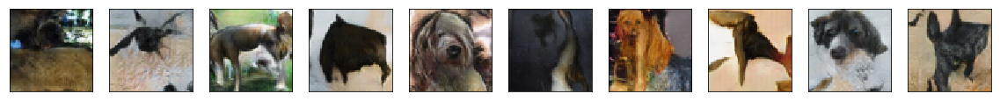

9712.657807350159
[272/400][468/692] Loss_D: 0.0149 Loss_G: 1.9008 D(x): 0.5967 D(G(z)): 0.1502 / 0.1236
[273/400][276/692] Loss_D: 0.0182 Loss_G: 2.0061 D(x): 0.6964 D(G(z)): 0.2338 / 0.1966
[274/400][84/692] Loss_D: 0.0155 Loss_G: 1.9904 D(x): 0.7425 D(G(z)): 0.2595 / 0.2477
[274/400][584/692] Loss_D: 0.0132 Loss_G: 1.9412 D(x): 0.7265 D(G(z)): 0.2621 / 0.2434
[275/400][392/692] Loss_D: 0.0152 Loss_G: 1.9886 D(x): 0.7633 D(G(z)): 0.2743 / 0.2682
[276/400][200/692] Loss_D: 0.0111 Loss_G: 2.0101 D(x): 0.7118 D(G(z)): 0.2166 / 0.2112


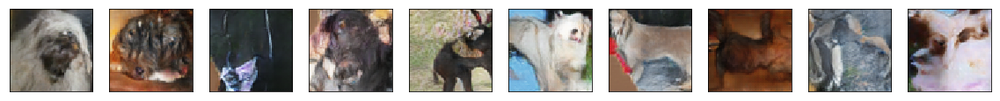

9894.1123046875
[277/400][8/692] Loss_D: 0.0090 Loss_G: 2.0011 D(x): 0.7431 D(G(z)): 0.2473 / 0.2441
[277/400][508/692] Loss_D: 0.0191 Loss_G: 2.0334 D(x): 0.6934 D(G(z)): 0.2311 / 0.1874
[278/400][316/692] Loss_D: 0.0164 Loss_G: 1.9439 D(x): 0.7211 D(G(z)): 0.2513 / 0.2383
[279/400][124/692] Loss_D: 0.0130 Loss_G: 2.0476 D(x): 0.7772 D(G(z)): 0.2835 / 0.2671
[279/400][624/692] Loss_D: 0.0189 Loss_G: 2.0220 D(x): 0.7335 D(G(z)): 0.2819 / 0.2296
[280/400][432/692] Loss_D: 0.0120 Loss_G: 2.1046 D(x): 0.7729 D(G(z)): 0.2358 / 0.2488
[281/400][240/692] Loss_D: 0.0171 Loss_G: 2.0443 D(x): 0.7267 D(G(z)): 0.2564 / 0.2178


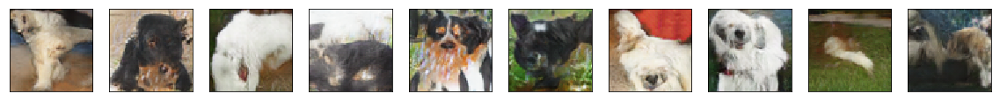

10075.48767375946
[282/400][48/692] Loss_D: 0.0136 Loss_G: 1.9180 D(x): 0.7600 D(G(z)): 0.2995 / 0.2828
[282/400][548/692] Loss_D: 0.0149 Loss_G: 1.9589 D(x): 0.7094 D(G(z)): 0.2438 / 0.2220
[283/400][356/692] Loss_D: 0.0182 Loss_G: 2.0010 D(x): 0.8287 D(G(z)): 0.2906 / 0.3308
[284/400][164/692] Loss_D: 0.0113 Loss_G: 1.9735 D(x): 0.7383 D(G(z)): 0.2563 / 0.2472
[284/400][664/692] Loss_D: 0.0164 Loss_G: 1.9475 D(x): 0.6961 D(G(z)): 0.2406 / 0.2114
[285/400][472/692] Loss_D: 0.0150 Loss_G: 2.0193 D(x): 0.7687 D(G(z)): 0.2919 / 0.2655
[286/400][280/692] Loss_D: 0.0142 Loss_G: 2.0705 D(x): 0.7736 D(G(z)): 0.2513 / 0.2585


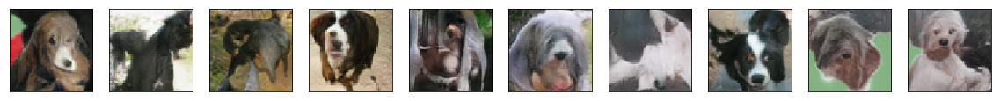

10256.056059837341
[287/400][88/692] Loss_D: 0.0158 Loss_G: 1.9886 D(x): 0.7618 D(G(z)): 0.2968 / 0.2661
[287/400][588/692] Loss_D: 0.0218 Loss_G: 2.0126 D(x): 0.7201 D(G(z)): 0.2838 / 0.2186
[288/400][396/692] Loss_D: 0.0122 Loss_G: 1.9655 D(x): 0.7416 D(G(z)): 0.2664 / 0.2523
[289/400][204/692] Loss_D: 0.0244 Loss_G: 2.0367 D(x): 0.7553 D(G(z)): 0.3244 / 0.2484
[290/400][12/692] Loss_D: 0.0132 Loss_G: 1.9981 D(x): 0.8119 D(G(z)): 0.3225 / 0.3149
[290/400][512/692] Loss_D: 0.0090 Loss_G: 2.0201 D(x): 0.7638 D(G(z)): 0.2575 / 0.2604
[291/400][320/692] Loss_D: 0.0137 Loss_G: 1.9971 D(x): 0.7674 D(G(z)): 0.2892 / 0.2700


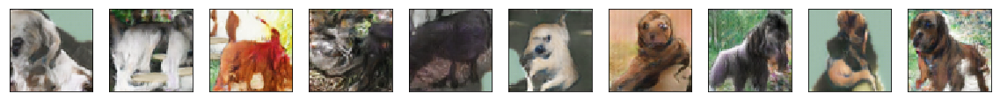

10437.596235275269
[292/400][128/692] Loss_D: 0.0127 Loss_G: 1.9608 D(x): 0.8082 D(G(z)): 0.3300 / 0.3202
[292/400][628/692] Loss_D: 0.0172 Loss_G: 1.9598 D(x): 0.7634 D(G(z)): 0.3000 / 0.2763
[293/400][436/692] Loss_D: 0.0166 Loss_G: 2.0139 D(x): 0.8255 D(G(z)): 0.3016 / 0.3238
[294/400][244/692] Loss_D: 0.0201 Loss_G: 1.9024 D(x): 0.8054 D(G(z)): 0.3608 / 0.3328
[295/400][52/692] Loss_D: 0.0140 Loss_G: 2.0337 D(x): 0.8760 D(G(z)): 0.3931 / 0.3695
[295/400][552/692] Loss_D: 0.0196 Loss_G: 2.0285 D(x): 0.8082 D(G(z)): 0.3480 / 0.3030
[296/400][360/692] Loss_D: 0.0110 Loss_G: 2.0240 D(x): 0.8334 D(G(z)): 0.3270 / 0.3295


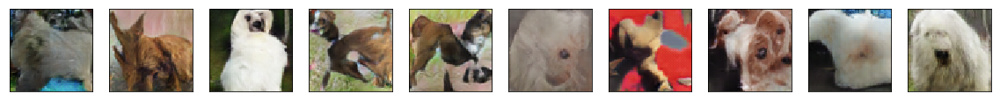

10618.41505932808
[297/400][168/692] Loss_D: 0.0136 Loss_G: 1.9988 D(x): 0.7748 D(G(z)): 0.3201 / 0.2768
[297/400][668/692] Loss_D: 0.0132 Loss_G: 2.0337 D(x): 0.8614 D(G(z)): 0.3719 / 0.3547
[298/400][476/692] Loss_D: 0.0178 Loss_G: 1.9315 D(x): 0.8320 D(G(z)): 0.3697 / 0.3524
[299/400][284/692] Loss_D: 0.0097 Loss_G: 2.0570 D(x): 0.8531 D(G(z)): 0.3574 / 0.3403
[300/400][92/692] Loss_D: 0.0160 Loss_G: 1.9485 D(x): 0.7706 D(G(z)): 0.3100 / 0.2860
[300/400][592/692] Loss_D: 0.0081 Loss_G: 2.0309 D(x): 0.8015 D(G(z)): 0.2936 / 0.2953
[301/400][400/692] Loss_D: 0.0124 Loss_G: 2.0099 D(x): 0.8718 D(G(z)): 0.3873 / 0.3713


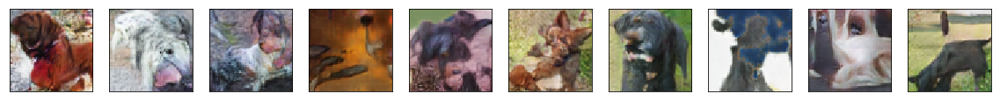

10799.69993019104
[302/400][208/692] Loss_D: 0.0200 Loss_G: 1.9575 D(x): 0.8069 D(G(z)): 0.3389 / 0.3207
[303/400][16/692] Loss_D: 0.0100 Loss_G: 2.0187 D(x): 0.8323 D(G(z)): 0.3444 / 0.3290
[303/400][516/692] Loss_D: 0.0125 Loss_G: 2.0308 D(x): 0.8181 D(G(z)): 0.3148 / 0.3125
[304/400][324/692] Loss_D: 0.0113 Loss_G: 2.0714 D(x): 0.8292 D(G(z)): 0.2993 / 0.3132
[305/400][132/692] Loss_D: 0.0145 Loss_G: 2.0185 D(x): 0.7980 D(G(z)): 0.3406 / 0.2948
[305/400][632/692] Loss_D: 0.0158 Loss_G: 2.0267 D(x): 0.8107 D(G(z)): 0.3599 / 0.3061
[306/400][440/692] Loss_D: 0.0111 Loss_G: 1.9962 D(x): 0.8530 D(G(z)): 0.3553 / 0.3561


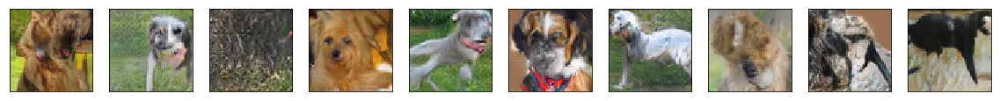

10980.583829402924
[307/400][248/692] Loss_D: 0.0115 Loss_G: 2.0186 D(x): 0.8138 D(G(z)): 0.3487 / 0.3106
[308/400][56/692] Loss_D: 0.0130 Loss_G: 2.0007 D(x): 0.8358 D(G(z)): 0.3415 / 0.3383
[308/400][556/692] Loss_D: 0.0136 Loss_G: 1.9830 D(x): 0.8674 D(G(z)): 0.3792 / 0.3742
[309/400][364/692] Loss_D: 0.0099 Loss_G: 2.0368 D(x): 0.9092 D(G(z)): 0.4003 / 0.4014
[310/400][172/692] Loss_D: 0.0176 Loss_G: 1.9454 D(x): 0.8307 D(G(z)): 0.3571 / 0.3475
[310/400][672/692] Loss_D: 0.0090 Loss_G: 2.0097 D(x): 0.8732 D(G(z)): 0.3726 / 0.3724
[311/400][480/692] Loss_D: 0.0148 Loss_G: 2.0058 D(x): 0.9340 D(G(z)): 0.4080 / 0.4341


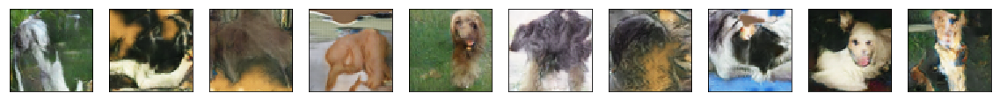

11160.797409296036
[312/400][288/692] Loss_D: 0.0139 Loss_G: 1.9295 D(x): 0.8506 D(G(z)): 0.3971 / 0.3701
[313/400][96/692] Loss_D: 0.0174 Loss_G: 2.0583 D(x): 0.9136 D(G(z)): 0.4546 / 0.4007
[313/400][596/692] Loss_D: 0.0126 Loss_G: 2.0163 D(x): 0.8817 D(G(z)): 0.3784 / 0.3792
[314/400][404/692] Loss_D: 0.0121 Loss_G: 1.9391 D(x): 0.8439 D(G(z)): 0.3788 / 0.3611
[315/400][212/692] Loss_D: 0.0099 Loss_G: 2.0379 D(x): 0.8407 D(G(z)): 0.3611 / 0.3325
[316/400][20/692] Loss_D: 0.0223 Loss_G: 1.9606 D(x): 0.8769 D(G(z)): 0.4039 / 0.3907
[316/400][520/692] Loss_D: 0.0159 Loss_G: 2.0380 D(x): 0.8937 D(G(z)): 0.3929 / 0.3872


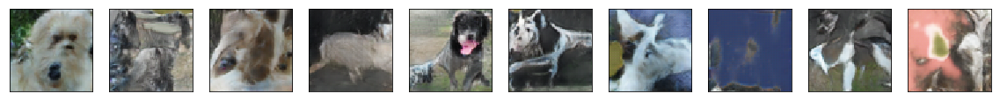

11341.754945993423
[317/400][328/692] Loss_D: 0.0101 Loss_G: 2.0211 D(x): 0.9247 D(G(z)): 0.4390 / 0.4206
[318/400][136/692] Loss_D: 0.0106 Loss_G: 2.0480 D(x): 0.9231 D(G(z)): 0.4072 / 0.4130
[318/400][636/692] Loss_D: 0.0110 Loss_G: 2.0053 D(x): 0.9055 D(G(z)): 0.4042 / 0.4061
[319/400][444/692] Loss_D: 0.0170 Loss_G: 2.0226 D(x): 0.8815 D(G(z)): 0.4244 / 0.3778
[320/400][252/692] Loss_D: 0.0139 Loss_G: 1.9015 D(x): 0.9074 D(G(z)): 0.4601 / 0.4341
[321/400][60/692] Loss_D: 0.0083 Loss_G: 2.0384 D(x): 1.0122 D(G(z)): 0.5160 / 0.5035
[321/400][560/692] Loss_D: 0.0118 Loss_G: 2.0112 D(x): 0.9811 D(G(z)): 0.4921 / 0.4795


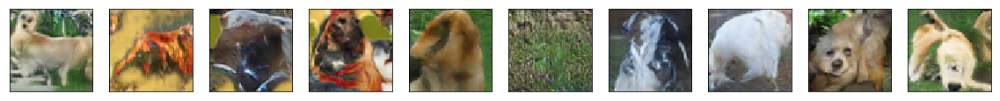

11522.60793018341
[322/400][368/692] Loss_D: 0.0084 Loss_G: 2.0508 D(x): 1.0078 D(G(z)): 0.4812 / 0.4963
[323/400][176/692] Loss_D: 0.0194 Loss_G: 1.9705 D(x): 0.8859 D(G(z)): 0.4515 / 0.3950
[323/400][676/692] Loss_D: 0.0162 Loss_G: 2.0030 D(x): 0.9466 D(G(z)): 0.4584 / 0.4483
[324/400][484/692] Loss_D: 0.0089 Loss_G: 2.0137 D(x): 1.0279 D(G(z)): 0.5207 / 0.5261
[325/400][292/692] Loss_D: 0.0091 Loss_G: 2.0242 D(x): 0.9801 D(G(z)): 0.5043 / 0.4753
[326/400][100/692] Loss_D: 0.0114 Loss_G: 1.9998 D(x): 0.9449 D(G(z)): 0.4541 / 0.4470
[326/400][600/692] Loss_D: 0.0143 Loss_G: 1.9501 D(x): 0.9759 D(G(z)): 0.5027 / 0.4907


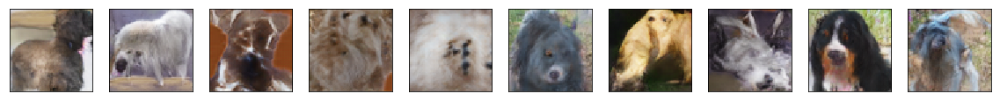

11704.311157941818
[327/400][408/692] Loss_D: 0.0209 Loss_G: 2.1097 D(x): 1.0052 D(G(z)): 0.5728 / 0.4797
[328/400][216/692] Loss_D: 0.0123 Loss_G: 1.9756 D(x): 0.9986 D(G(z)): 0.5187 / 0.5071
[329/400][24/692] Loss_D: 0.0132 Loss_G: 2.0482 D(x): 0.9732 D(G(z)): 0.4679 / 0.4624
[329/400][524/692] Loss_D: 0.0245 Loss_G: 2.0420 D(x): 0.9515 D(G(z)): 0.5307 / 0.4431
[330/400][332/692] Loss_D: 0.0125 Loss_G: 2.0798 D(x): 1.0389 D(G(z)): 0.5209 / 0.5212
[331/400][140/692] Loss_D: 0.0085 Loss_G: 2.0530 D(x): 1.0705 D(G(z)): 0.5746 / 0.5585
[331/400][640/692] Loss_D: 0.0086 Loss_G: 2.0247 D(x): 1.0323 D(G(z)): 0.5260 / 0.5277


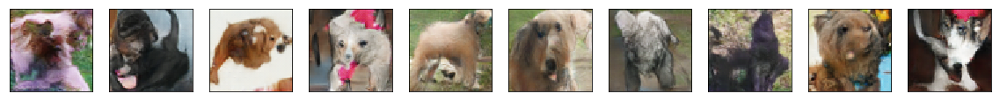

11885.773897647858
[332/400][448/692] Loss_D: 0.0149 Loss_G: 1.9585 D(x): 0.9943 D(G(z)): 0.5228 / 0.5074
[333/400][256/692] Loss_D: 0.0113 Loss_G: 2.0131 D(x): 1.0631 D(G(z)): 0.5540 / 0.5615
[334/400][64/692] Loss_D: 0.0149 Loss_G: 2.0493 D(x): 1.0560 D(G(z)): 0.5415 / 0.5466
[334/400][564/692] Loss_D: 0.0236 Loss_G: 2.1787 D(x): 1.1087 D(G(z)): 0.5326 / 0.5670
[335/400][372/692] Loss_D: 0.0167 Loss_G: 2.0219 D(x): 1.0701 D(G(z)): 0.6027 / 0.5669
[336/400][180/692] Loss_D: 0.0145 Loss_G: 1.9149 D(x): 1.0148 D(G(z)): 0.5555 / 0.5385
[336/400][680/692] Loss_D: 0.0089 Loss_G: 1.9977 D(x): 1.1070 D(G(z)): 0.6171 / 0.6091


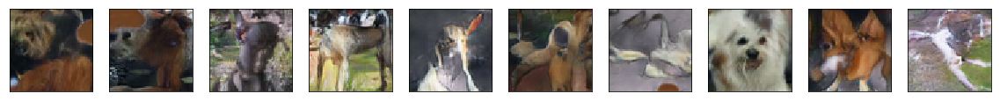

12065.788842916489
[337/400][488/692] Loss_D: 0.0147 Loss_G: 2.0206 D(x): 1.1628 D(G(z)): 0.6660 / 0.6596
[338/400][296/692] Loss_D: 0.0155 Loss_G: 1.9625 D(x): 1.0573 D(G(z)): 0.5803 / 0.5693
[339/400][104/692] Loss_D: 0.0165 Loss_G: 2.0573 D(x): 1.1501 D(G(z)): 0.5989 / 0.6375
[339/400][604/692] Loss_D: 0.0087 Loss_G: 2.0326 D(x): 1.0373 D(G(z)): 0.5653 / 0.5301
[340/400][412/692] Loss_D: 0.0118 Loss_G: 1.9440 D(x): 1.0719 D(G(z)): 0.6015 / 0.5879
[341/400][220/692] Loss_D: 0.0212 Loss_G: 2.0095 D(x): 1.0440 D(G(z)): 0.6263 / 0.5432


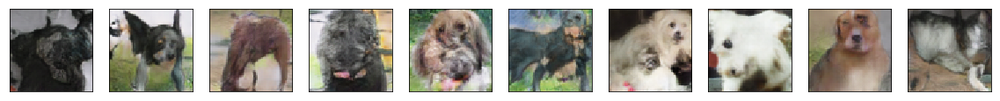

12246.26875424385
[342/400][28/692] Loss_D: 0.0139 Loss_G: 2.0341 D(x): 1.1585 D(G(z)): 0.6490 / 0.6526
[342/400][528/692] Loss_D: 0.0076 Loss_G: 2.0046 D(x): 1.1504 D(G(z)): 0.6453 / 0.6506
[343/400][336/692] Loss_D: 0.0130 Loss_G: 2.0335 D(x): 1.1753 D(G(z)): 0.7127 / 0.6682
[344/400][144/692] Loss_D: 0.0143 Loss_G: 1.9420 D(x): 1.1736 D(G(z)): 0.7172 / 0.6902
[344/400][644/692] Loss_D: 0.0133 Loss_G: 1.9724 D(x): 1.1921 D(G(z)): 0.7179 / 0.7011
[345/400][452/692] Loss_D: 0.0107 Loss_G: 1.9949 D(x): 1.1547 D(G(z)): 0.6608 / 0.6573
[346/400][260/692] Loss_D: 0.0136 Loss_G: 1.9595 D(x): 1.1995 D(G(z)): 0.7260 / 0.7121


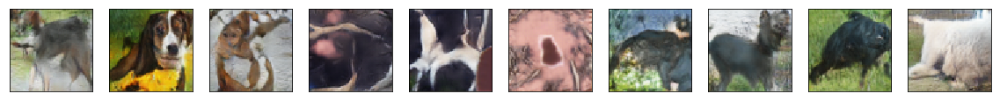

12425.930314302444
[347/400][68/692] Loss_D: 0.0100 Loss_G: 2.0207 D(x): 1.2167 D(G(z)): 0.7319 / 0.7129
[347/400][568/692] Loss_D: 0.0144 Loss_G: 2.0106 D(x): 1.2687 D(G(z)): 0.7242 / 0.7674
[348/400][376/692] Loss_D: 0.0067 Loss_G: 2.0158 D(x): 1.1942 D(G(z)): 0.6971 / 0.6915
[349/400][184/692] Loss_D: 0.0140 Loss_G: 2.0449 D(x): 1.2242 D(G(z)): 0.7449 / 0.7146
[349/400][684/692] Loss_D: 0.0164 Loss_G: 2.0119 D(x): 1.2244 D(G(z)): 0.7553 / 0.7236
[350/400][492/692] Loss_D: 0.0084 Loss_G: 2.0635 D(x): 1.2869 D(G(z)): 0.7614 / 0.7725
[351/400][300/692] Loss_D: 0.0168 Loss_G: 1.9815 D(x): 1.2353 D(G(z)): 0.7723 / 0.7422


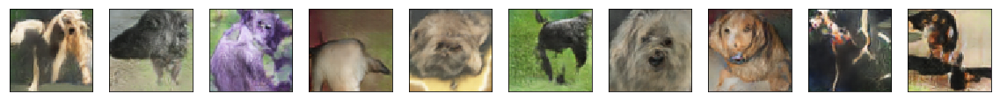

12606.501472949982
[352/400][108/692] Loss_D: 0.0122 Loss_G: 1.9448 D(x): 1.2042 D(G(z)): 0.7397 / 0.7200
[352/400][608/692] Loss_D: 0.0063 Loss_G: 1.9823 D(x): 1.2325 D(G(z)): 0.7464 / 0.7381
[353/400][416/692] Loss_D: 0.0107 Loss_G: 2.0339 D(x): 1.3202 D(G(z)): 0.8344 / 0.8133
[354/400][224/692] Loss_D: 0.0105 Loss_G: 2.0444 D(x): 1.3493 D(G(z)): 0.8360 / 0.8401
[355/400][32/692] Loss_D: 0.0122 Loss_G: 2.0635 D(x): 1.3725 D(G(z)): 0.8282 / 0.8579
[355/400][532/692] Loss_D: 0.0193 Loss_G: 2.0169 D(x): 1.2668 D(G(z)): 0.8371 / 0.7639
[356/400][340/692] Loss_D: 0.0109 Loss_G: 1.9623 D(x): 1.3417 D(G(z)): 0.8722 / 0.8529


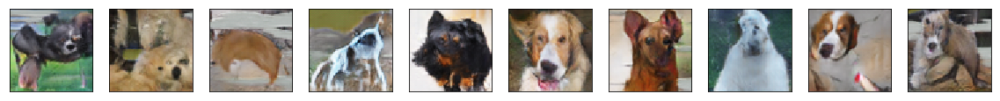

12787.561412096024
[357/400][148/692] Loss_D: 0.0114 Loss_G: 2.0269 D(x): 1.3538 D(G(z)): 0.8591 / 0.8488
[357/400][648/692] Loss_D: 0.0106 Loss_G: 2.0563 D(x): 1.3671 D(G(z)): 0.8880 / 0.8547
[358/400][456/692] Loss_D: 0.0101 Loss_G: 1.9400 D(x): 1.3349 D(G(z)): 0.8576 / 0.8518
[359/400][264/692] Loss_D: 0.0135 Loss_G: 1.9906 D(x): 1.3618 D(G(z)): 0.8337 / 0.8657
[360/400][72/692] Loss_D: 0.0080 Loss_G: 1.9664 D(x): 1.3198 D(G(z)): 0.8394 / 0.8296
[360/400][572/692] Loss_D: 0.0114 Loss_G: 1.9989 D(x): 1.3720 D(G(z)): 0.8837 / 0.8741
[361/400][380/692] Loss_D: 0.0082 Loss_G: 2.0282 D(x): 1.3916 D(G(z)): 0.8877 / 0.8858


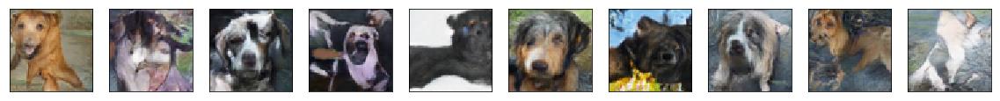

12967.446345329285
[362/400][188/692] Loss_D: 0.0094 Loss_G: 2.0368 D(x): 1.2732 D(G(z)): 0.7596 / 0.7656
[362/400][688/692] Loss_D: 0.0084 Loss_G: 2.0170 D(x): 1.4140 D(G(z)): 0.9045 / 0.9112
[363/400][496/692] Loss_D: 0.0111 Loss_G: 2.0588 D(x): 1.3913 D(G(z)): 0.8561 / 0.8782
[364/400][304/692] Loss_D: 0.0107 Loss_G: 1.9771 D(x): 1.4329 D(G(z)): 0.9543 / 0.9406
[365/400][112/692] Loss_D: 0.0114 Loss_G: 2.0125 D(x): 1.4900 D(G(z)): 0.9742 / 0.9884
[365/400][612/692] Loss_D: 0.0124 Loss_G: 2.0393 D(x): 1.4244 D(G(z)): 0.9054 / 0.9164
[366/400][420/692] Loss_D: 0.0183 Loss_G: 1.8729 D(x): 1.3632 D(G(z)): 0.9324 / 0.8972


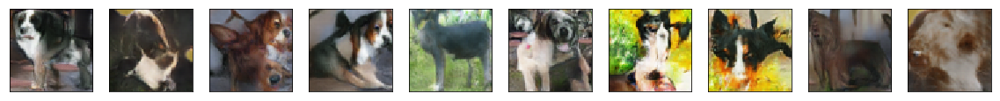

13148.179639339447
[367/400][228/692] Loss_D: 0.0135 Loss_G: 2.0225 D(x): 1.5036 D(G(z)): 1.0138 / 1.0000
[368/400][36/692] Loss_D: 0.0126 Loss_G: 2.0019 D(x): 1.4458 D(G(z)): 0.9504 / 0.9478
[368/400][536/692] Loss_D: 0.0114 Loss_G: 1.9702 D(x): 1.4386 D(G(z)): 0.9672 / 0.9481
[369/400][344/692] Loss_D: 0.0160 Loss_G: 2.0162 D(x): 1.4613 D(G(z)): 1.0189 / 0.9586
[370/400][152/692] Loss_D: 0.0105 Loss_G: 1.9152 D(x): 1.4485 D(G(z)): 0.9914 / 0.9713
[370/400][652/692] Loss_D: 0.0178 Loss_G: 1.8617 D(x): 1.5091 D(G(z)): 1.0716 / 1.0463
[371/400][460/692] Loss_D: 0.0102 Loss_G: 1.9735 D(x): 1.6025 D(G(z)): 1.0855 / 1.1106


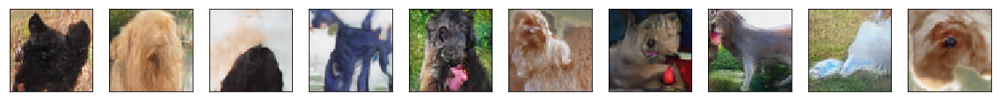

13328.150782585144
[372/400][268/692] Loss_D: 0.0220 Loss_G: 1.8719 D(x): 1.5156 D(G(z)): 1.0928 / 1.0502
[373/400][76/692] Loss_D: 0.0068 Loss_G: 2.0026 D(x): 1.4807 D(G(z)): 1.0120 / 0.9808
[373/400][576/692] Loss_D: 0.0148 Loss_G: 2.0268 D(x): 1.5895 D(G(z)): 1.1085 / 1.0848
[374/400][384/692] Loss_D: 0.0098 Loss_G: 1.9260 D(x): 1.5057 D(G(z)): 1.0445 / 1.0258
[375/400][192/692] Loss_D: 0.0095 Loss_G: 2.0532 D(x): 1.6331 D(G(z)): 1.1399 / 1.1214
[376/400][0/692] Loss_D: 0.0138 Loss_G: 1.9209 D(x): 1.6303 D(G(z)): 1.1148 / 1.1525
[376/400][500/692] Loss_D: 0.0085 Loss_G: 1.9766 D(x): 1.5998 D(G(z)): 1.1148 / 1.1072


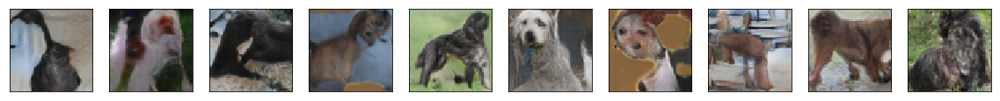

13509.110620260239
[377/400][308/692] Loss_D: 0.0097 Loss_G: 2.0166 D(x): 1.6513 D(G(z)): 1.1641 / 1.1486
[378/400][116/692] Loss_D: 0.0089 Loss_G: 2.0084 D(x): 1.5816 D(G(z)): 1.0845 / 1.0813
[378/400][616/692] Loss_D: 0.0079 Loss_G: 1.9902 D(x): 1.6503 D(G(z)): 1.1615 / 1.1544
[379/400][424/692] Loss_D: 0.0157 Loss_G: 2.0530 D(x): 1.6947 D(G(z)): 1.2471 / 1.1833
[380/400][232/692] Loss_D: 0.0083 Loss_G: 2.0240 D(x): 1.6624 D(G(z)): 1.1567 / 1.1580
[381/400][40/692] Loss_D: 0.0089 Loss_G: 2.0325 D(x): 1.6817 D(G(z)): 1.1900 / 1.1748
[381/400][540/692] Loss_D: 0.0123 Loss_G: 2.0134 D(x): 1.7029 D(G(z)): 1.2215 / 1.2014


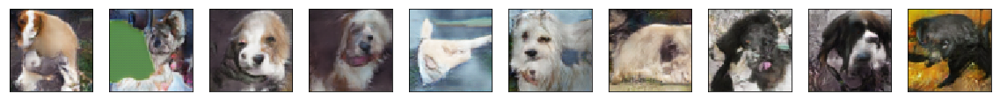

13689.228385925293
[382/400][348/692] Loss_D: 0.0120 Loss_G: 1.9025 D(x): 1.6180 D(G(z)): 1.1681 / 1.1441
[383/400][156/692] Loss_D: 0.0119 Loss_G: 1.9958 D(x): 1.7295 D(G(z)): 1.2552 / 1.2324
[383/400][656/692] Loss_D: 0.0109 Loss_G: 1.9842 D(x): 1.7749 D(G(z)): 1.2613 / 1.2803
[384/400][464/692] Loss_D: 0.0078 Loss_G: 2.0149 D(x): 1.8043 D(G(z)): 1.3135 / 1.3021
[385/400][272/692] Loss_D: 0.0106 Loss_G: 1.9762 D(x): 1.8008 D(G(z)): 1.2839 / 1.3081
[386/400][80/692] Loss_D: 0.0227 Loss_G: 1.8641 D(x): 1.7361 D(G(z)): 1.3143 / 1.2728
[386/400][580/692] Loss_D: 0.0077 Loss_G: 1.9560 D(x): 1.7983 D(G(z)): 1.3227 / 1.3107


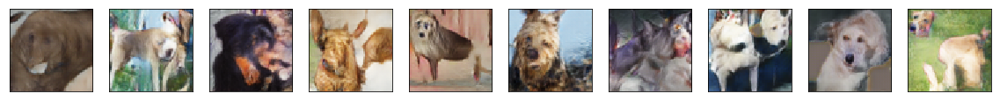

13870.968168497086
[387/400][388/692] Loss_D: 0.0089 Loss_G: 2.0066 D(x): 1.8137 D(G(z)): 1.3345 / 1.3134
[388/400][196/692] Loss_D: 0.0088 Loss_G: 1.9961 D(x): 1.8820 D(G(z)): 1.3953 / 1.3846
[389/400][4/692] Loss_D: 0.0089 Loss_G: 2.0468 D(x): 1.9251 D(G(z)): 1.4638 / 1.4145
[389/400][504/692] Loss_D: 0.0159 Loss_G: 2.0400 D(x): 1.9327 D(G(z)): 1.4879 / 1.4242
[390/400][312/692] Loss_D: 0.0139 Loss_G: 1.9459 D(x): 1.8267 D(G(z)): 1.3739 / 1.3423
[391/400][120/692] Loss_D: 0.0157 Loss_G: 2.0577 D(x): 1.9234 D(G(z)): 1.4732 / 1.4107
[391/400][620/692] Loss_D: 0.0085 Loss_G: 2.0017 D(x): 1.8895 D(G(z)): 1.3878 / 1.3904


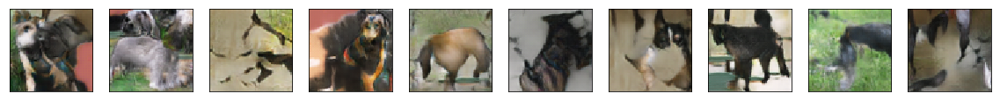

14051.72334933281
[392/400][428/692] Loss_D: 0.0067 Loss_G: 2.0647 D(x): 1.9808 D(G(z)): 1.4635 / 1.4660
[393/400][236/692] Loss_D: 0.0092 Loss_G: 2.0636 D(x): 2.0009 D(G(z)): 1.5383 / 1.4862
[394/400][44/692] Loss_D: 0.0061 Loss_G: 2.0542 D(x): 1.9704 D(G(z)): 1.4576 / 1.4581
[394/400][544/692] Loss_D: 0.0073 Loss_G: 1.9788 D(x): 2.0539 D(G(z)): 1.5640 / 1.5607
[395/400][352/692] Loss_D: 0.0091 Loss_G: 2.0155 D(x): 2.0359 D(G(z)): 1.5397 / 1.5335
[396/400][160/692] Loss_D: 0.0108 Loss_G: 2.0555 D(x): 2.0476 D(G(z)): 1.5254 / 1.5358
[396/400][660/692] Loss_D: 0.0076 Loss_G: 1.9669 D(x): 2.0146 D(G(z)): 1.5387 / 1.5242


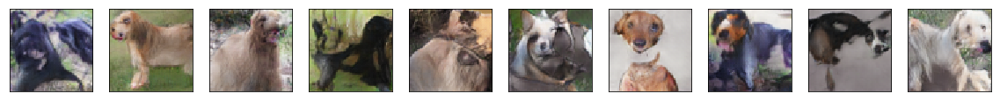

14231.37801527977
[397/400][468/692] Loss_D: 0.0103 Loss_G: 2.0686 D(x): 2.1194 D(G(z)): 1.6420 / 1.6036
[398/400][276/692] Loss_D: 0.0088 Loss_G: 2.0850 D(x): 2.0742 D(G(z)): 1.5330 / 1.5543
[399/400][84/692] Loss_D: 0.0091 Loss_G: 1.9960 D(x): 2.1170 D(G(z)): 1.6016 / 1.6193
[399/400][584/692] Loss_D: 0.0080 Loss_G: 2.0173 D(x): 2.1409 D(G(z)): 1.6126 / 1.6377
[400/400][392/692] Loss_D: 0.0047 Loss_G: 2.0214 D(x): 2.1388 D(G(z)): 1.6345 / 1.6344


In [12]:
netG = Generator(LATENT_DIM, CONV_DEPTHS_G, IMG_CHANNEL).to(device)
netD = Discriminator(3, CONV_DEPTHS_D).to(device)
LEARNING_RATE_G = 0.003
LEARNING_RATE_D = 0.001 
optimizerD = torch.optim.Adam(netD.parameters(), lr=LEARNING_RATE_G, betas=(BETA_1, 0.999))
optimizerG = torch.optim.Adam(netG.parameters(), lr=LEARNING_RATE_D, betas=(BETA_1, 0.999))
lr_schedulerG = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizerG,
                                                                     T_0=EPOCHS // T0_interval, eta_min=0.00005)
lr_schedulerD = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizerD,
                                                                     T_0=EPOCHS // T0_interval, eta_min=0.00005)
fixed_noise = torch.randn(25, LATENT_DIM, 1, 1, device=device)
real_label = 0.5
fake_label = 0.0
batch_size = train_loader.batch_size
train_module(EPOCHS)

In [13]:
netG.eval()
if not os.path.exists('../output_images'):
    os.mkdir('../output_images')
im_batch_size = 50
n_images = 10000
for i_batch in range(0, n_images, im_batch_size):
    z = truncated_normal((im_batch_size, LATENT_DIM, 1, 1), threshold=1)
    gen_z = torch.from_numpy(z).float().to(device)
    gen_images = netG(gen_z)
    images = gen_images.to("cpu").clone().detach()
    images = images.numpy().transpose(0, 2, 3, 1)
    for i_image in range(gen_images.size(0)):
        torchvision.utils.save_image((gen_images[i_image, :, :, :] + 1.0) / 2.0,
                                     os.path.join('../output_images', f'image_{i_batch + i_image:05d}.png'))

shutil.make_archive('images', 'zip', '../output_images')

'/kaggle/working/images.zip'